In [12]:
%matplotlib widget

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Import statements:
import sys
import os
import yaml
sys.path.append(os.getcwd() + '/../Client_modules/')

from mTempControl import *
import mResSweepDouble
from socProxy import makeProxy
import h5py
from PythonDrivers.control_atten import setatten
from PythonDrivers.getInputDicts import *
import time
import datetime
from run_FFS import run_FFS
from PythonDrivers.ldausbcli import CLI_Vaunix_Attn
from contextlib import contextmanager,redirect_stderr,redirect_stdout
from os import devnull
import time

# tempPath = os.path.join('Z:','t1Team','logFiles')

Could not import QickSoc: No module named 'pynq'


In [3]:
# Temperature monitoring infrastructure (this could be a module)
tc = tempController() # needs to be reinstantiated to read in latest day's logfile

In [4]:
# Instantiate four instances of the RFSOC
socs=[]
soccfgs=[]

soc1,soccfg1=makeProxy('192.168.1.10')
socs.append(soc1)
soccfgs.append(soccfg1)
print(soccfg1)

soc2,soccfg2=makeProxy('192.168.1.11')
socs.append(soc2)
soccfgs.append(soccfg2)
print(soccfg2)

# soc3,soccfg3=makeProxy('192.168.1.12')
# socs.append(soc3)
# soccfgs.append(soccfg3)
# print(soccfg3)

# soc4,soccfg4=makeProxy('192.168.1.13')
# socs.append(soc4)
# soccfgs.append(soccfg4)
# print(soccfg4)

Pyro.NameServer PYRO:Pyro.NameServer@192.168.1.10:8888
myqick PYRO:obj_f8223c3415864d2ba9e7b76bd728d254@192.168.1.10:42925

QICK configuration:

	Board: ZCU216

	Global clocks (MHz): tProcessor 430.080, RF reference 245.760

	7 signal generator channels:
	0:	axis_signal_gen_v4 - tProc output 1, envelope memory 65536 samples
		DAC tile 2, ch 0, 32-bit DDS, fabric=430.080 MHz, fs=6881.280 MHz
	1:	axis_signal_gen_v4 - tProc output 2, envelope memory 65536 samples
		DAC tile 2, ch 1, 32-bit DDS, fabric=430.080 MHz, fs=6881.280 MHz
	2:	axis_signal_gen_v4 - tProc output 3, envelope memory 65536 samples
		DAC tile 2, ch 2, 32-bit DDS, fabric=430.080 MHz, fs=6881.280 MHz
	3:	axis_signal_gen_v4 - tProc output 4, envelope memory 65536 samples
		DAC tile 2, ch 3, 32-bit DDS, fabric=430.080 MHz, fs=6881.280 MHz
	4:	axis_signal_gen_v4 - tProc output 5, envelope memory 65536 samples
		DAC tile 3, ch 0, 32-bit DDS, fabric=430.080 MHz, fs=6881.280 MHz
	5:	axis_signal_gen_v4 - tProc output 6, envelope 

# Read in sweep parameters

In [5]:
os.getcwd()

'c:\\Users\\my\\Documents\\GitHub\\ZCU216\\res_dev\\FFS'

In [6]:
# Read in sweep initial confirguration from yaml file
setup_file_name='2023-02-29_cooldown_au-chips_NFS_setup.yaml'
setup_file_location = os.path.join('setup_files',setup_file_name)

stream = open(setup_file_location, 'r')
setupDict = yaml.full_load(stream)
stream.close()

# create and add wanted chipDicts, add a chip for each rfsoc
chipDicts=[]
chipDict1 = setupDict['2023-11-30_TAHP02_Au_StarCryo230518-1+96nm']
chipDict2 = setupDict['2024-02-25 TAHP02_Au_StarCryo230518-1+144nm']
# chipDict3 = setupDict['2023-10-31_TAHP02_Au_StarCryo230518-1+24nm']


chipDicts.append(chipDict1)
chipDicts.append(chipDict2)
# chipDicts.append(chipDict3)

In [ ]:
....................................................

In [8]:
tc.setTemp(0)

# Set attenuations and check that we using a good power

In [9]:
savePath = r'Z:\t1Team\Data\rfsoc_dump'
attobj = CLI_Vaunix_Attn()
attobj.set_attenuation(1,0,1)
attobj.set_attenuation(1,0,2)
# attobj.set_attenuation(1,5,3)
# attobj.set_attenuation(1,5,4)

True

In [13]:
getInputDicts(chipDict2,measType='FFS')[3]

FileNotFoundError: [Errno 2] No such file or directory: '..\\dBm_lookup\\'

Frequencies out are: [6396.7, 7734.35] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 10.795 s


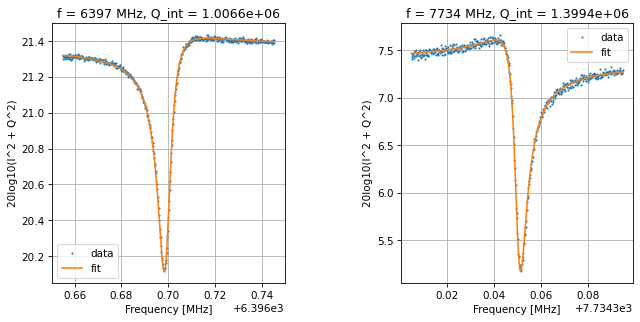

([array([6.39669898e+09, 1.00658684e+06, 6.78654286e+06, 1.22237772e+03,
         2.13659815e+01]),
  array([ 7.73435017e+09,  1.39936538e+06,  5.45867375e+06, -3.19948178e+03,
          7.38142200e+00])],
 [array([[ 7.15069027e+01,  1.12914479e+03,  4.03498238e+04,
           3.34865973e+01, -7.65002433e-04],
         [ 1.12914479e+03,  6.70879669e+06,  2.72391668e+07,
          -3.63414186e+03, -4.96654882e-01],
         [ 4.03498238e+04,  2.72391668e+07,  2.21469271e+08,
           1.31584827e+03, -4.20982603e+00],
         [ 3.34865973e+01, -3.63414186e+03,  1.31584827e+03,
           3.13204188e+01, -4.69717936e-05],
         [-7.65002433e-04, -4.96654882e-01, -4.20982603e+00,
          -4.69717936e-05,  2.04527169e-07]]),
  array([[ 2.39173520e+02,  8.22454315e+03, -1.70292951e+05,
           1.89803412e+02,  5.98500758e-03],
         [ 8.22454315e+03,  4.90868187e+07,  1.00437171e+08,
           6.03455758e+04, -3.45342249e+00],
         [-1.70292951e+05,  1.00437171e+08,  6.578

In [52]:
#RFSoC 10

# define sweep params
inputDict = {}
inputDict['LO_f'] = 0  # local oscillator frequency

# define frequencies
inputDict['span_f'] = [0.09, 0.09]

# # center freqs
# inputDict['res_f']=[5785.28, 6106.066]
# inputDict['names']=['5p78', '6p10']

# center freqs
# inputDict['res_f']=[6546.681, 6691.374]
# inputDict['names']=['6p54', '6p69']

# # center freqs
# inputDict['res_f']=[6945.03, 7363.165]
# inputDict['names']=['6p94', '7p36']

# center freqs
inputDict['res_f']=[6396.70, 7734.35]
inputDict['names']=['6p39', '7p73']

# define numbers of points
inputDict['n_expts'] = 500  # number of points along the frequency axis
inputDict['n_rounds'] = 1 # number of times to sweep along the frequency axis
inputDict['n_reps'] = 1  # number of repetitions to take at each frequency point

# timing. Units are clock cycles, but converted from us
inputDict['ring_up_time'] = 500  # time waiting for the resonator to ring up at the start of each sweep
inputDict['ring_between_time'] = 50  # time waiting for the resonator to ring up at the start of each sweep
inputDict['readout_length'] = 10000  # time to average over
inputDict['adc_trig_offset'] = 0.1  # time after the DAC starts the final steady pulse before the ADC starts it's read

# power
# idxs = [np.argmin(np.abs(np.array(f)-inputDict['res_f'][0])),np.argmin(np.abs(np.array(f)-inputDict['res_f'][1]))]
inputDict['basePowers'] = 0 # dBm
inputDict['gain'] = [30000, 30000]

# acquire data
# Acquire
inputDict['power'] = inputDict['basePowers']


Instance2 = mResSweepDouble.ResSweep(path=savePath, prefix='phase_test', inputDict=inputDict, soc=socs[0], soccfg=soccfgs[0])

with open(devnull,'w') as f:
    with redirect_stderr(f):
        data2 = mResSweepDouble.ResSweep.acquire(Instance2)
mResSweepDouble.ResSweep.display(Instance2, data2, fit=True)

Frequencies out are: [7724.87, 7499.65] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 10.930 s


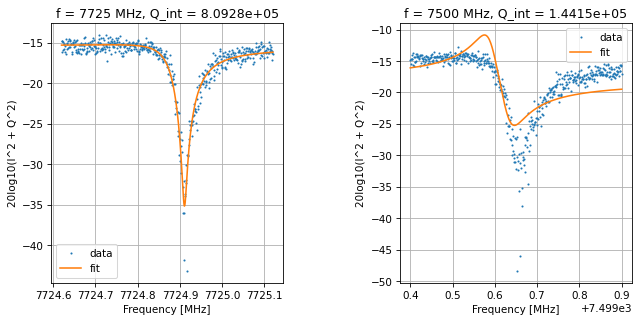

([array([ 7.72489925e+09,  8.09280116e+05,  9.77465209e+04, -7.23287329e+04,
         -1.55639010e+01]),
  array([ 7.49958689e+09,  1.44154567e+05,  9.19110296e+09, -3.02434006e+05,
         -1.80508226e+01])],
 [array([[ 8.57289310e+05, -6.82228007e+06,  2.26761321e+05,
           4.49177925e+06,  7.22477958e+00],
         [-6.82228007e+06,  2.11988403e+09,  3.58306668e+07,
          -4.30092748e+07,  6.04948897e+02],
         [ 2.26761321e+05,  3.58306668e+07,  5.58197093e+06,
           5.72493956e+05,  1.08119207e+02],
         [ 4.49177925e+06, -4.30092748e+07,  5.72493956e+05,
           2.55010131e+07,  2.78318931e+01],
         [ 7.22477958e+00,  6.04948897e+02,  1.08119207e+02,
           2.78318931e+01,  4.41704467e-03]]),
  array([[ 5.76437293e+06, -1.92619297e+07,  9.06770772e+16,
           1.71716468e+07,  1.59845682e+02],
         [-1.92619297e+07,  1.78128896e+08, -4.92968891e+17,
          -1.00769747e+08, -9.51533001e+02],
         [ 9.06770772e+16, -4.92968891e+17,  

In [21]:
# RFSoC 11

# define sweep params
inputDict = {}
inputDict['LO_f'] = 0  # local oscillator frequency

# define frequencies
inputDict['span_f'] = [0.5,0.5]

# center freqs
inputDict['res_f']=[7724.87, 7499.65]
inputDict['names']=['7p72', '7p49']

# center freqs
# inputDict['res_f']=[6550.802, 6842.415]
# inputDict['names']=['6p55', '6p84']

# # center freqs
# inputDict['res_f']=[7329.38, 7465.74]
# inputDict['names']=['7p32', '7p46']

# # center freqs
# inputDict['res_f']=[7738.146, 8039.15]
# inputDict['names']=['7p73', '8p03']


# define numbers of points
inputDict['n_expts'] = 500  # number of points along the frequency axis
inputDict['n_rounds'] = 1 # number of times to sweep along the frequency axis
inputDict['n_reps'] = 1  # number of repetitions to take at each frequency point

# timing. Units are clock cycles, but converted from us
inputDict['ring_up_time'] = 500  # time waiting for the resonator to ring up at the start of each sweep
inputDict['ring_between_time'] = 50  # time waiting for the resonator to ring up at the start of each sweep
inputDict['readout_length'] = 10000  # time to average over
inputDict['adc_trig_offset'] = 0.1  # time after the DAC starts the final steady pulse before the ADC starts it's read

# power
# idxs = [np.argmin(np.abs(np.array(f)-inputDict['res_f'][0])),np.argmin(np.abs(np.array(f)-inputDict['res_f'][1]))]
inputDict['basePowers'] = 0 # dBm
inputDict['gain'] = [100, 100]

# acquire data
# Acquire
inputDict['power'] = inputDict['basePowers']
Instance2 = mResSweepDouble.ResSweep(path=savePath, prefix='phase_test', inputDict=inputDict, soc=socs[0], soccfg=soccfgs[0])

with open(devnull,'w') as f:
    with redirect_stderr(f):
        data2 = mResSweepDouble.ResSweep.acquire(Instance2)
mResSweepDouble.ResSweep.display(Instance2, data2, fit=True)
# mResSweepDouble.ResSweep.save_data(Instance2, data2)

Frequencies out are: [4418.416, 4660.223] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 11.110 s


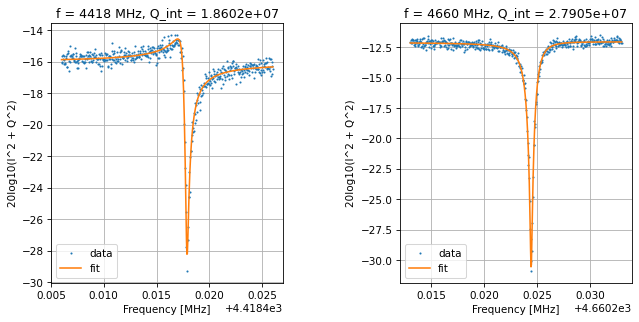

([array([ 4.41841761e+09,  1.86020898e+07,  7.56907552e+06, -1.60507547e+03,
         -1.60427209e+01]),
  array([ 4.66022449e+09,  2.79046680e+07,  3.72977510e+06,  3.46284650e+02,
         -1.21030651e+01])],
 [array([[ 5.04072269e+01,  3.10506497e+06, -1.82336091e+05,
           2.05851219e+02,  1.40156716e-02],
         [ 3.10506497e+06,  4.28496781e+11,  7.11085707e+09,
           1.51546181e+07,  2.93755869e+01],
         [-1.82336091e+05,  7.11085707e+09,  1.60376579e+10,
           3.58674069e+04, -8.13245153e+02],
         [ 2.05851219e+02,  1.51546181e+07,  3.58674069e+04,
           1.07797045e+03,  2.39258164e-02],
         [ 1.40156716e-02,  2.93755869e+01, -8.13245153e+02,
           2.39258164e-02,  2.73475481e-04]]),
  array([[ 2.93879337e+01,  2.60419532e+06,  3.71779503e+04,
           1.36703472e+02, -4.80782998e-03],
         [ 2.60419532e+06,  6.37550718e+11,  1.03679620e+10,
           1.18758050e+07, -1.90280698e+03],
         [ 3.71779503e+04,  1.03679620e+10,  

In [42]:
# RFSoC 12

# define sweep params
inputDict = {}
inputDict['LO_f'] = 0  # local oscillator frequency

# define frequencies
inputDict['span_f'] = [0.02, 0.02]

# center freqs

inputDict['res_f']=[ 4418.416, 4660.223]
inputDict['names']=['4p42',
  '4p66']

# inputDict['res_f']=[ 4858.895, 4994.3475]
# inputDict['names']=['4p86',
#   '4p99']

# define numbers of points
inputDict['n_expts'] = 500  # number of points along the frequency axis
inputDict['n_rounds'] = 1 # number of times to sweep along the frequency axis
inputDict['n_reps'] = 1  # number of repetitions to take at each frequency point
# inputDict['n_reps'] = 1

# timing. Units are clock cycles, but converted from us
inputDict['ring_up_time'] = 500  # time waiting for the resonator to ring up at the start of each sweep
inputDict['ring_between_time'] = 50  # time waiting for the resonator to ring up at the start of each sweep
inputDict['readout_length'] = 10000  # time to average over
inputDict['adc_trig_offset'] = 0.1  # time after the DAC starts the final steady pulse before the ADC starts it's read

# power
# idxs = [np.argmin(np.abs(np.array(f)-inputDict['res_f'][0])),np.argmin(np.abs(np.array(f)-inputDict['res_f'][1]))]
inputDict['basePowers'] = 0 # dBm
inputDict['gain'] = [20000, 20000]

# acquire data
# Acquire
inputDict['power'] = inputDict['basePowers']
Instance2 = mResSweepDouble.ResSweep(path=savePath, prefix='phase_test', inputDict=inputDict, soc=socs[0], soccfg=soccfgs[0])

with open(devnull,'w') as f:
    with redirect_stderr(f):
        data2 = mResSweepDouble.ResSweep.acquire(Instance2)
mResSweepDouble.ResSweep.display(Instance2, data2, fit=True)
# mResSweepDouble.ResSweep.save_data(Instance2, data2)

Frequencies out are: [7386.783, 7998.15] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 10.991 s


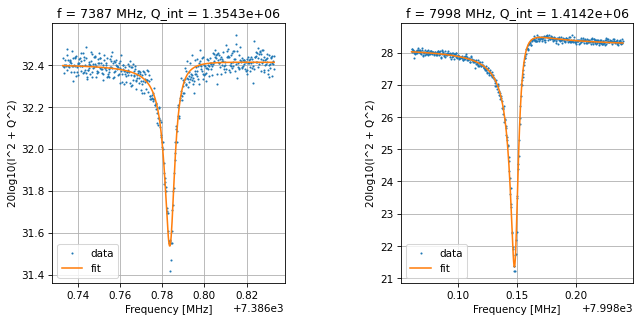

In [34]:
# RFSoC 13

# define sweep params
inputDict = {}
inputDict['LO_f'] = 0  # local oscillator frequency

# define frequencies
inputDict['span_f'] = [.1, .18]

# center freqs

# inputDict['res_f']=[7386.783,7998.15]
# inputDict['names']=['4p42',
#   '4p70']

inputDict['res_f']=[7386.783,7998.15]
inputDict['names']=['4p42',
  '4p70']
# define numbers of points
inputDict['n_expts'] = 500  # number of points along the frequency axis
inputDict['n_rounds'] = 1 # number of times to sweep along the frequency axis
inputDict['n_reps'] = 1  # number of repetitions to take at each frequency point
# inputDict['n_reps'] = 1

# timing. Units are clock cycles, but converted from us
inputDict['ring_up_time'] = 500  # time waiting for the resonator to ring up at the start of each sweep
inputDict['ring_between_time'] = 50  # time waiting for the resonator to ring up at the start of each sweep
inputDict['readout_length'] = 10000  # time to average over
inputDict['adc_trig_offset'] = 0.1  # time after the DAC starts the final steady pulse before the ADC starts it's read

# power
# idxs = [np.argmin(np.abs(np.array(f)-inputDict['res_f'][0])),np.argmin(np.abs(np.array(f)-inputDict['res_f'][1]))]
inputDict['basePowers'] = 0 # dBm
inputDict['gain'] = [30000, 30000]

# acquire data
# Acquire
inputDict['power'] = inputDict['basePowers']
Instance2 = mResSweepDouble.ResSweep(path=savePath, prefix='phase_test', inputDict=inputDict, soc=socs[3], soccfg=soccfgs[3])

with open(devnull,'w') as f:
    with redirect_stderr(f):
        data2 = mResSweepDouble.ResSweep.acquire(Instance2)
pOpt,pCov= mResSweepDouble.ResSweep.display(Instance2, data2, fit=True)
# mResSweepDouble.ResSweep.save_data(Instance2, data2)

In [37]:
lw1 = pOpt[0][0] * ((1 / pOpt[0][1]) + (1 / pOpt[0][2])) / 1e6
lw2 = pOpt[1][0] * ((1 / pOpt[1][1]) + (1 / pOpt[1][2])) / 1e6
num_lws=20
print(num_lws*lw1,num_lws*lw2)

0.12052910168118734 0.24003935627700912


In [33]:
tc.setTemp(0.00)

In [71]:
temps=np.arange(0.048,0.290,0.015) # units are in Kelvin
temps2 = np.arange(.018,.050,.005)

print(temps)

[0.048 0.063 0.078 0.093 0.108 0.123 0.138 0.153 0.168 0.183 0.198 0.213
 0.228 0.243 0.258 0.273 0.288]


In [68]:
temps2 = np.arange(.018,.050,.005)
print(temps)

[0.018 0.023 0.028 0.033 0.038 0.043 0.048]


# Take measurements

In [14]:
attobj = CLI_Vaunix_Attn()
attobj.set_attenuation(1,0,1)
attobj.set_attenuation(1,0,2)
# attobj.set_attenuation(1,5,3)
# attobj.set_attenuation(1,5,4)

True

In [18]:
np.arange(.210,.500,.02)

array([0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41,
       0.43, 0.45, 0.47, 0.49])

[0.015 0.025 0.035 0.045 0.055 0.065 0.075 0.085 0.095 0.105 0.115 0.125
 0.135 0.145 0.155 0.165 0.175 0.185 0.195]
new


  0%|          | 0/19 [00:00<?, ?it/s]

Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.911 s


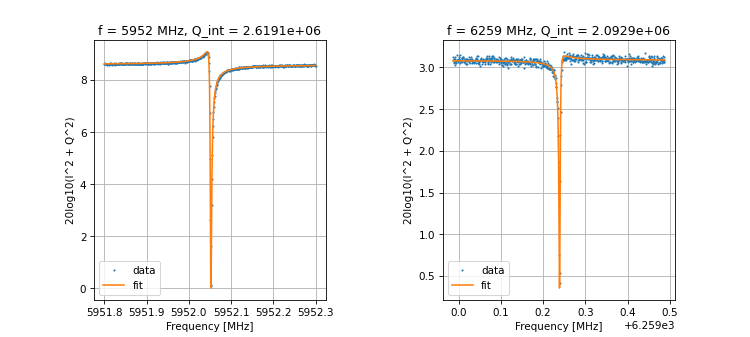

Frequencies out are: [5952.051074712998, 6259.239217480285] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.685 s


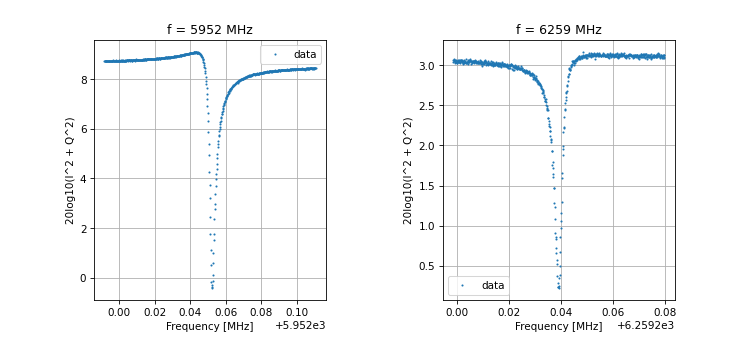

Saving data-2024-03-09-13-45-36
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.911 s


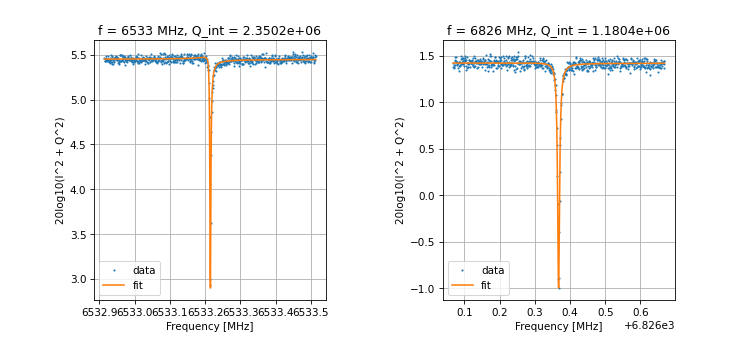

Frequencies out are: [6533.214760938098, 6826.367404651876] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.370 s


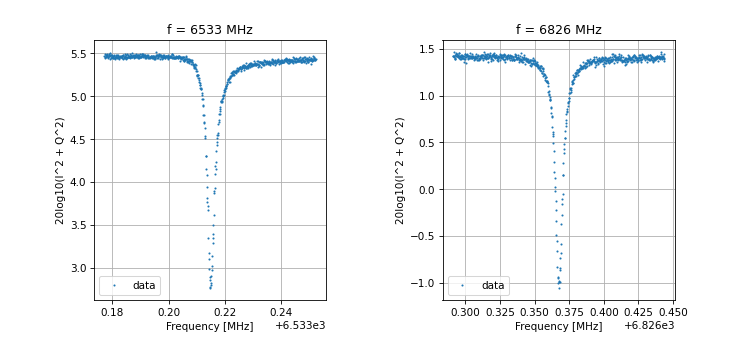

Saving data-2024-03-09-13-46-45
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 13.706 s


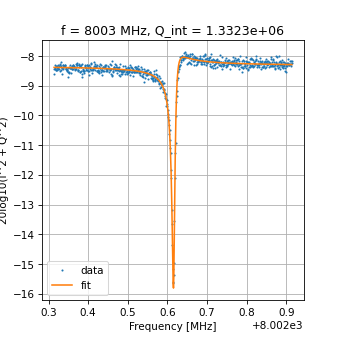

Frequencies out are: [8002.6171600693915] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 40.797 s


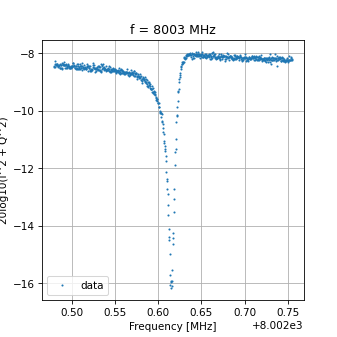

Saving data-2024-03-09-13-47-50
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.692 s


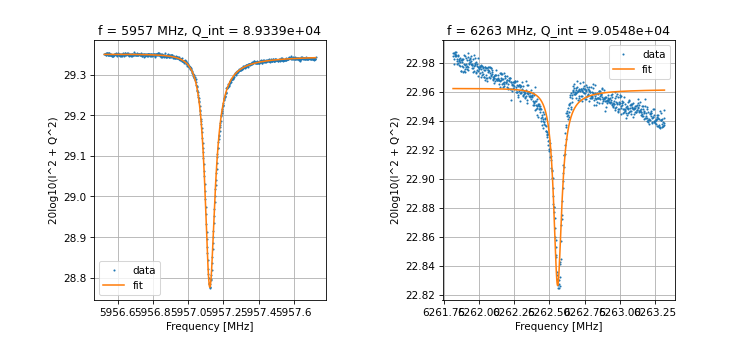

Frequencies out are: [5957.120831652576, 6262.557685998784] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.036 s


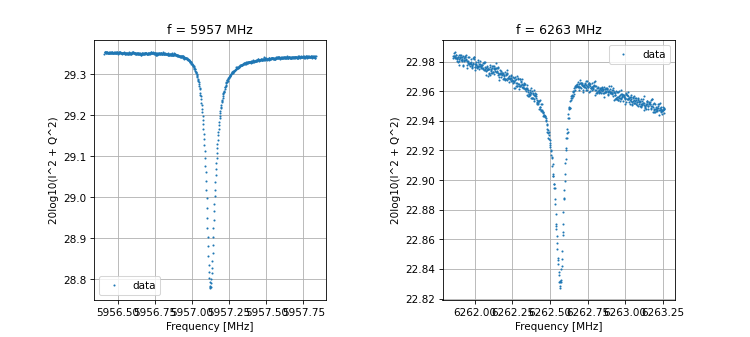

Saving data-2024-03-09-13-48-49
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.909 s


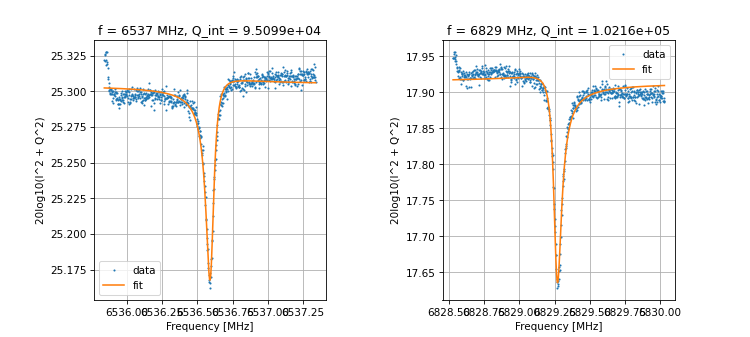

Frequencies out are: [6536.594670045935, 6829.265913508652] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.366 s


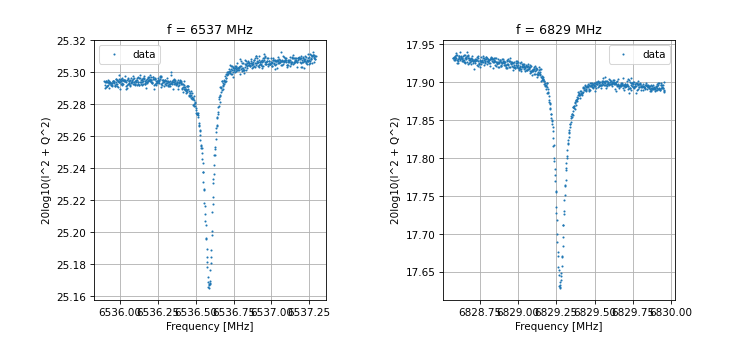

  5%|▌         | 1/19 [45:30<13:39:09, 2730.53s/it]

Saving data-2024-03-09-13-49-57
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.909 s


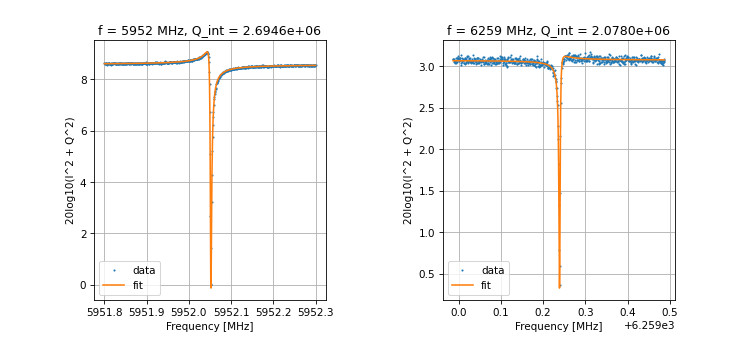

Frequencies out are: [5952.0511032246195, 6259.239191803284] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.397 s


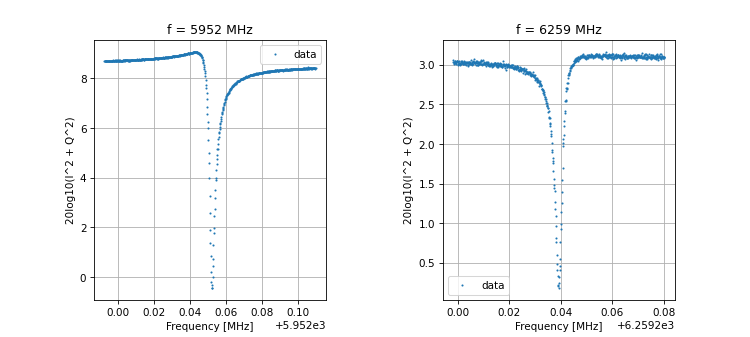

Saving data-2024-03-09-14-31-06
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.856 s


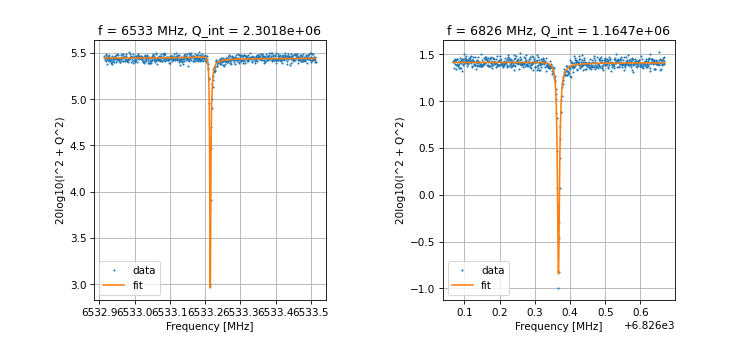

Frequencies out are: [6533.21461698138, 6826.366976942049] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.344 s


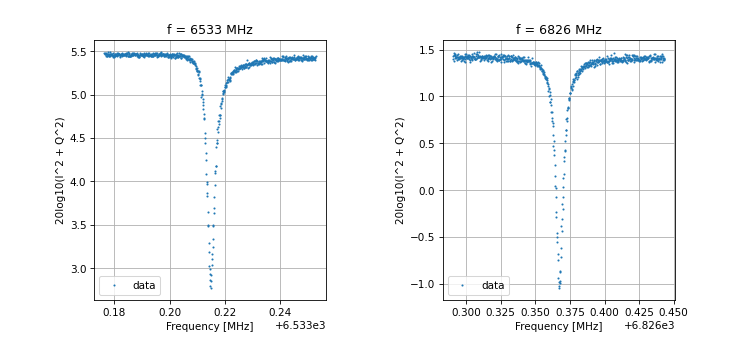

Saving data-2024-03-09-14-32-15
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 13.777 s


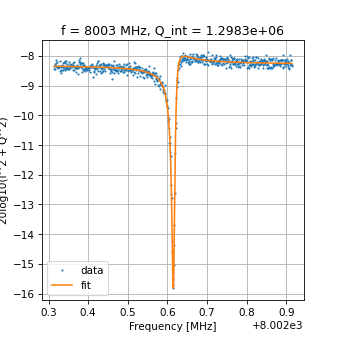

Frequencies out are: [8002.6169459768635] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 40.987 s


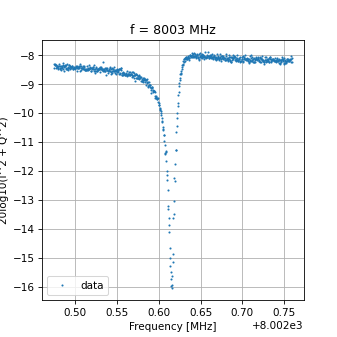

Saving data-2024-03-09-14-33-20
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 17.003 s


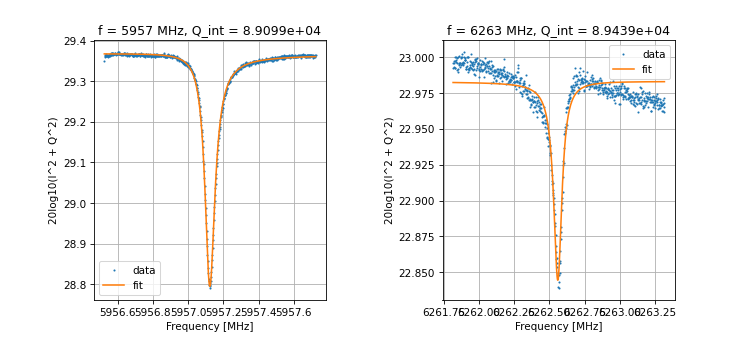

Frequencies out are: [5957.1212838996935, 6262.560991723072] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.119 s


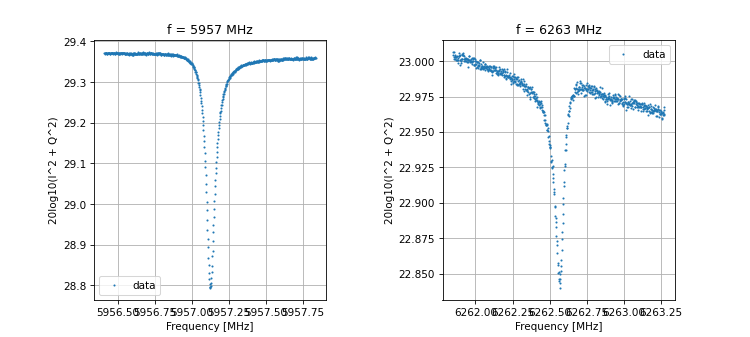

Saving data-2024-03-09-14-34-19
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 17.011 s


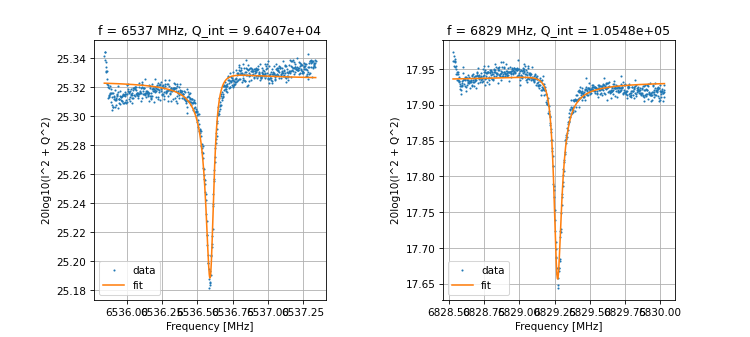

Frequencies out are: [6536.595192481208, 6829.267448196492] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.479 s


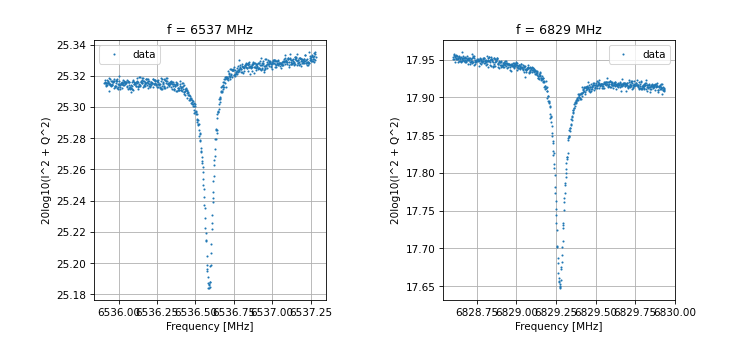

 11%|█         | 2/19 [1:31:01<12:53:42, 2730.75s/it]

Saving data-2024-03-09-14-35-28
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.657 s


c:\Users\my\Documents\GitHub\ZCU216\res_dev\FFS/../Client_modules\mResSweepDouble.py:310: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(10, 4.5), dpi=75)


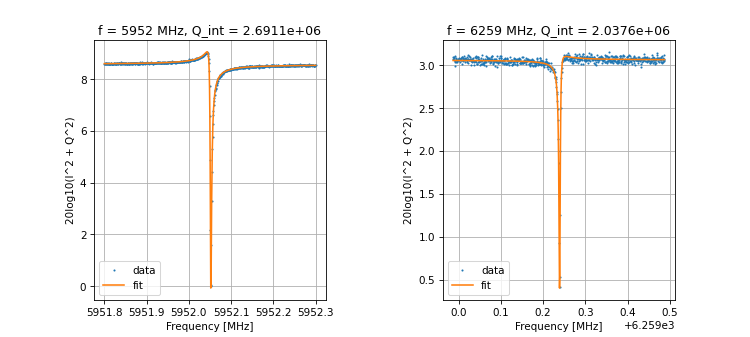

Frequencies out are: [5952.051031208879, 6259.239327715059] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 47.076 s


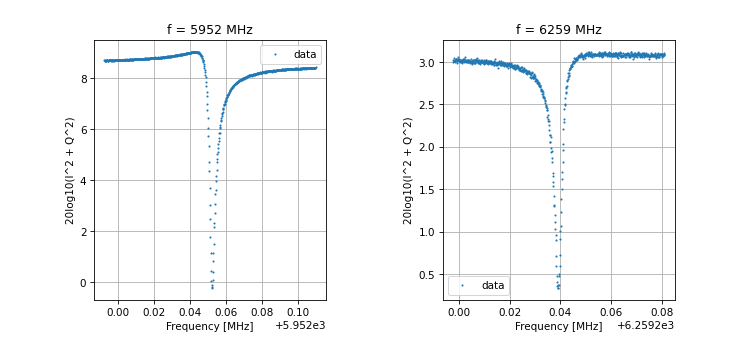

Saving data-2024-03-09-15-16-36
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.688 s


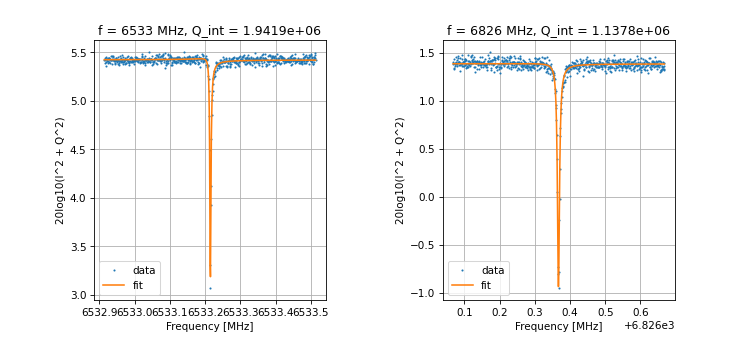

Frequencies out are: [6533.2148105482975, 6826.367009050666] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.801 s


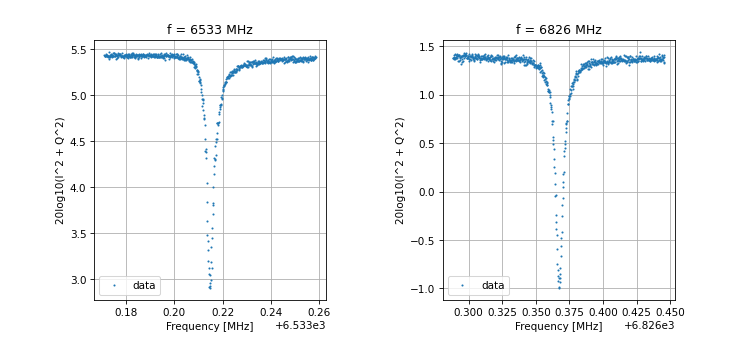

Saving data-2024-03-09-15-17-40
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.912 s


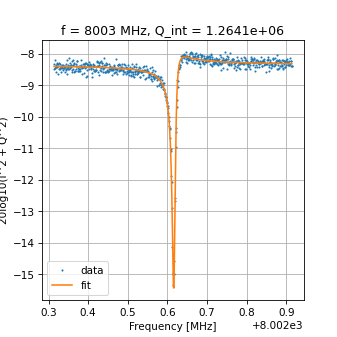

Frequencies out are: [8002.617684402566] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.912 s


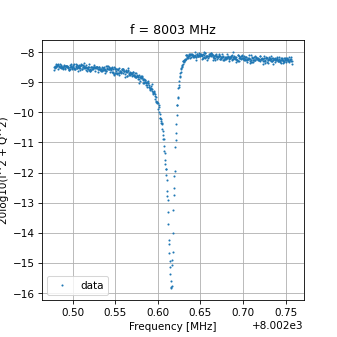

Saving data-2024-03-09-15-18-41
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.792 s


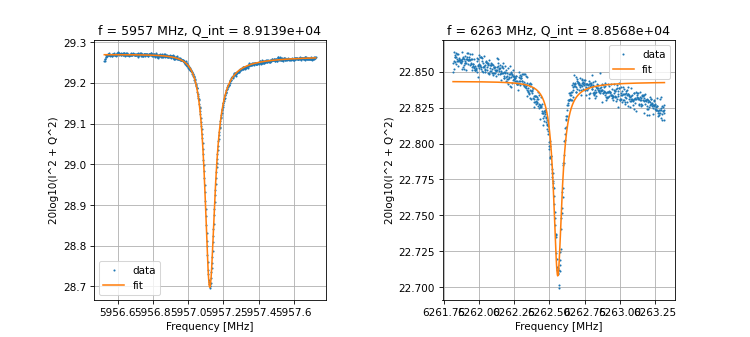

Frequencies out are: [5957.120708263283, 6262.558938735347] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.891 s


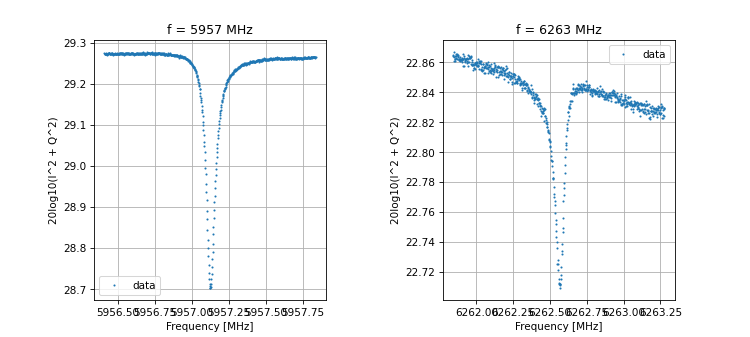

Saving data-2024-03-09-15-19-37
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.663 s


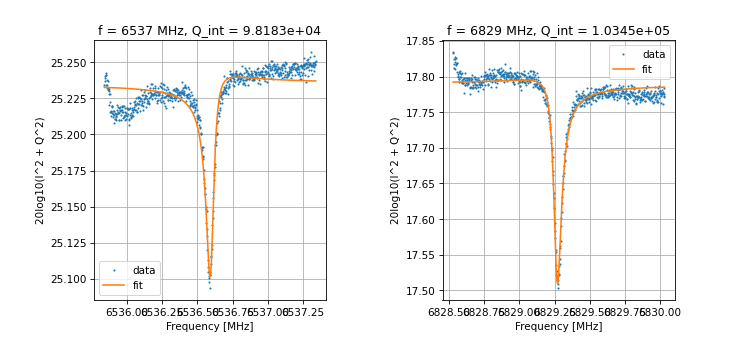

Frequencies out are: [6536.596708356071, 6829.266408296479] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.713 s


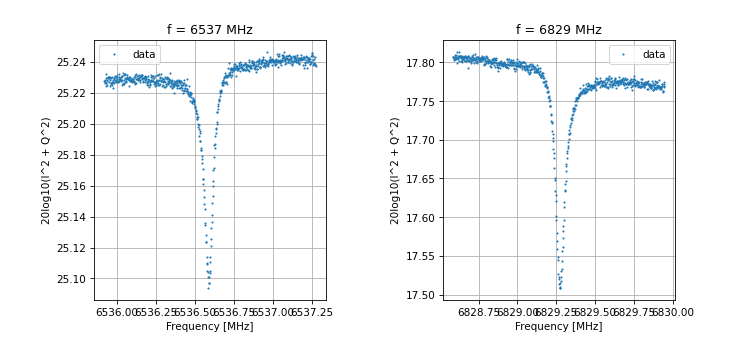

 16%|█▌        | 3/19 [2:16:10<12:05:31, 2720.71s/it]

Saving data-2024-03-09-15-20-41
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.643 s


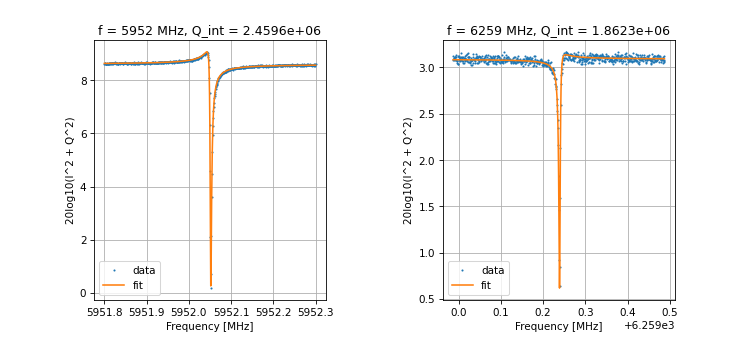

Frequencies out are: [5952.050918994574, 6259.239191530284] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 47.160 s


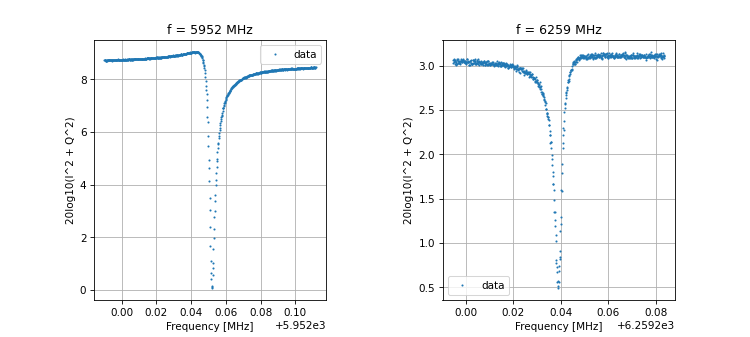

Saving data-2024-03-09-16-01-44
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.668 s


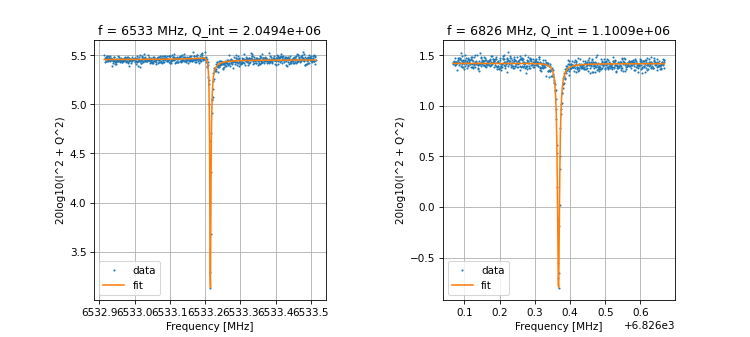

Frequencies out are: [6533.214775264696, 6826.367170873894] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 47.016 s


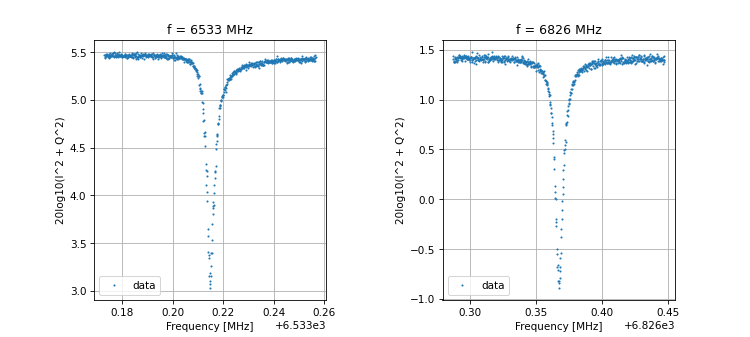

Saving data-2024-03-09-16-02-49
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.890 s


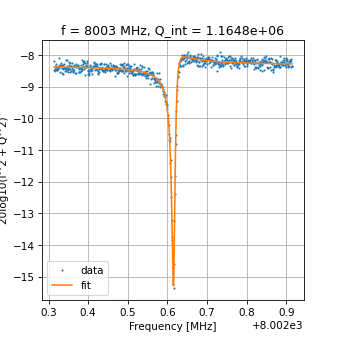

Frequencies out are: [8002.617237113087] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.692 s


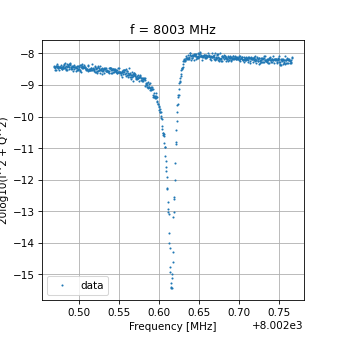

Saving data-2024-03-09-16-03-50
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.673 s


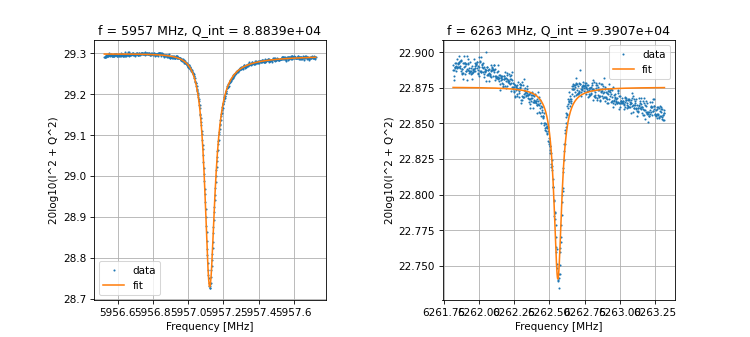

Frequencies out are: [5957.120335390644, 6262.560629518341] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.778 s


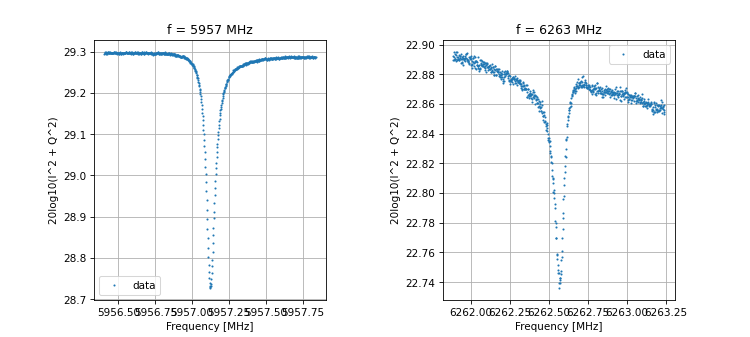

Saving data-2024-03-09-16-04-46
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.664 s


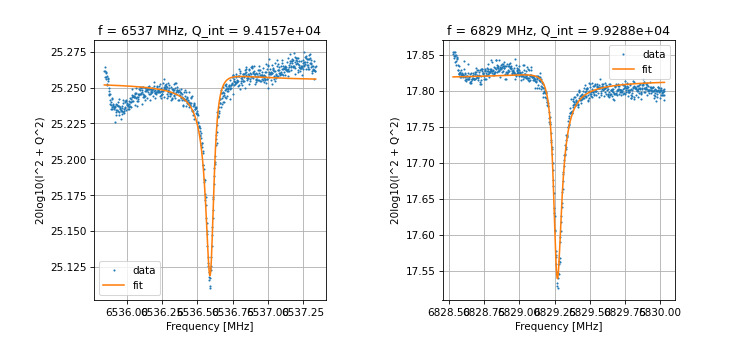

Frequencies out are: [6536.595345198644, 6829.265314233321] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.822 s


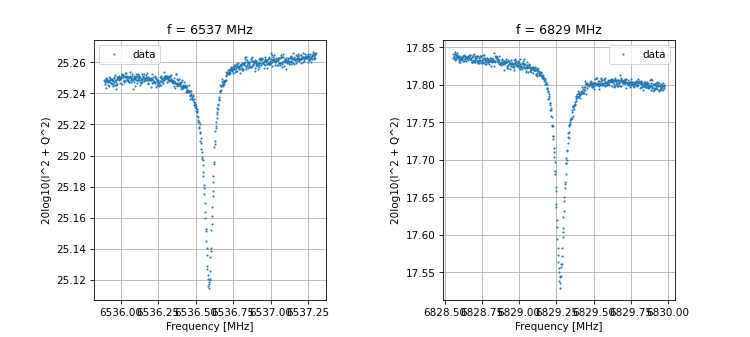

 21%|██        | 4/19 [3:01:19<11:19:01, 2716.11s/it]

Saving data-2024-03-09-16-05-49
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.398 s


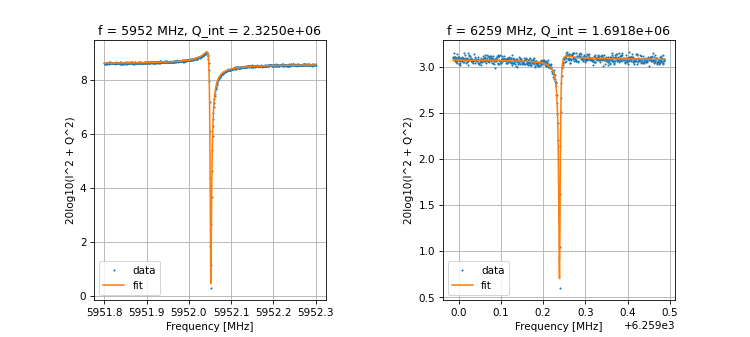

Frequencies out are: [5952.050800979813, 6259.239034897776] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.209 s


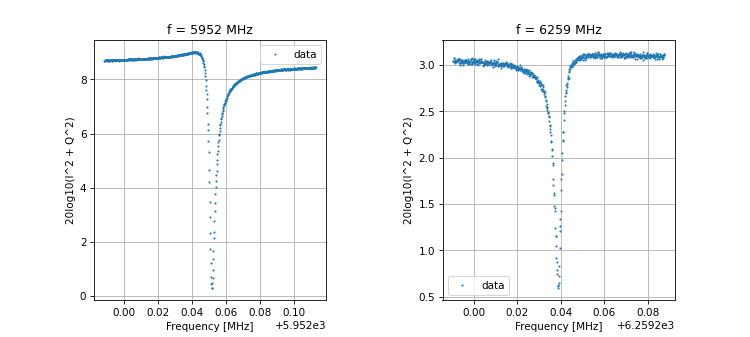

Saving data-2024-03-09-16-46-53
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.691 s


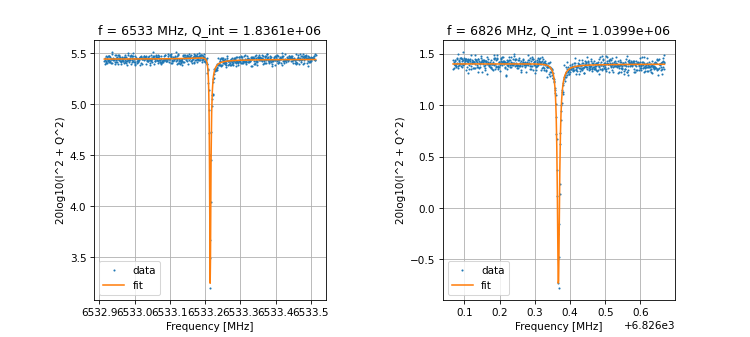

Frequencies out are: [6533.214374765516, 6826.3669028374625] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.861 s


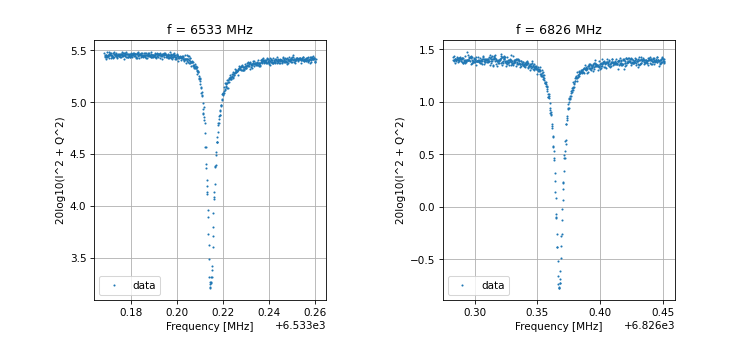

Saving data-2024-03-09-16-47-57
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.970 s


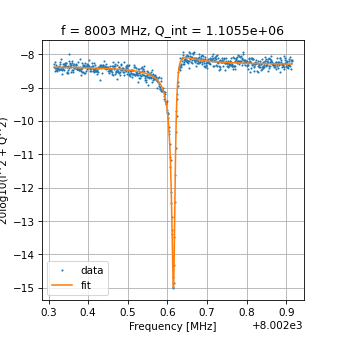

Frequencies out are: [8002.617171592639] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.875 s


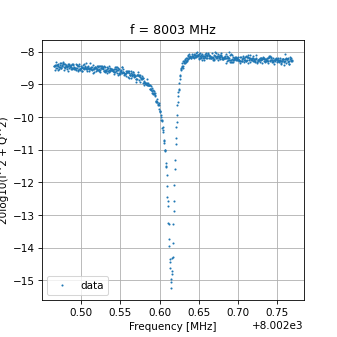

Saving data-2024-03-09-16-48-58
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.578 s


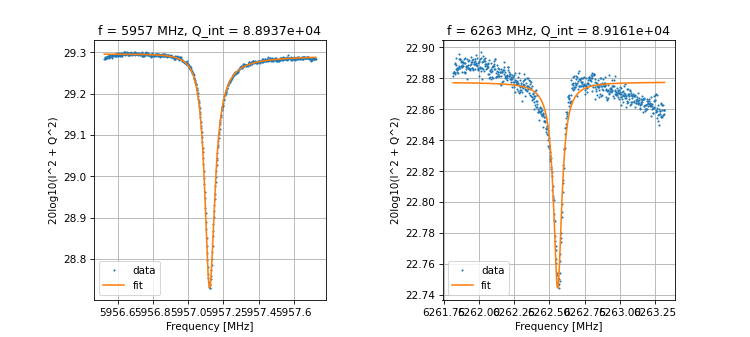

Frequencies out are: [5957.119705647204, 6262.559633105903] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.731 s


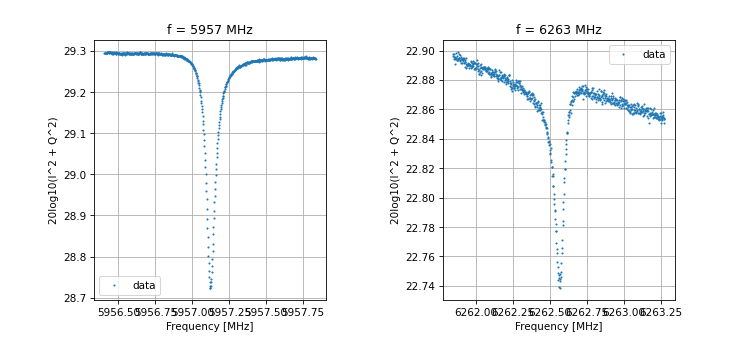

Saving data-2024-03-09-16-49-54
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.625 s


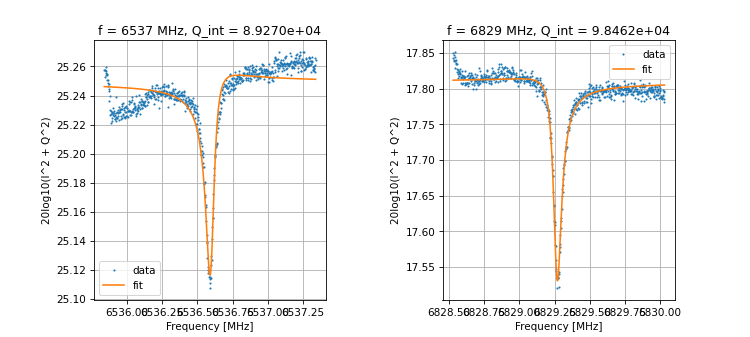

Frequencies out are: [6536.59740535346, 6829.265882642801] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 47.290 s


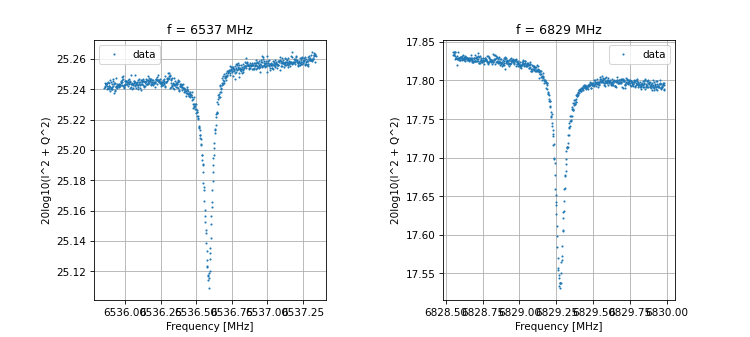

 26%|██▋       | 5/19 [3:46:27<10:33:06, 2713.34s/it]

Saving data-2024-03-09-16-50-57
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 17.123 s


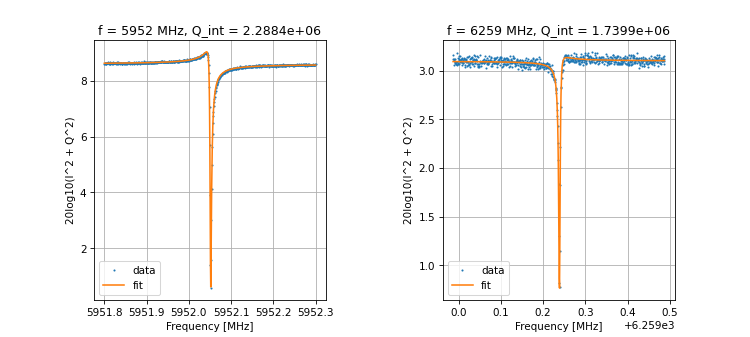

Frequencies out are: [5952.050639218139, 6259.238910256937] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.669 s


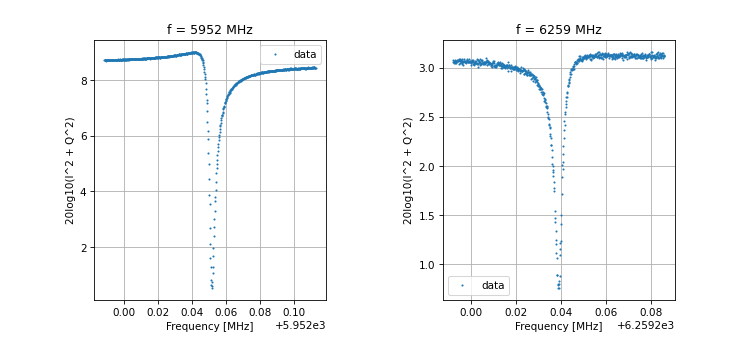

Saving data-2024-03-09-17-32-04
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 17.057 s


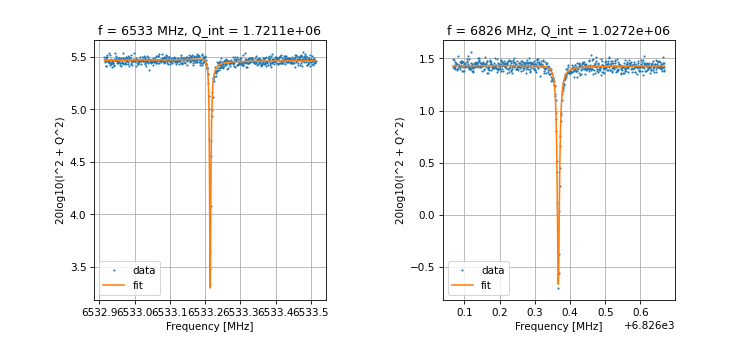

Frequencies out are: [6533.2142613585975, 6826.36666070656] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.637 s


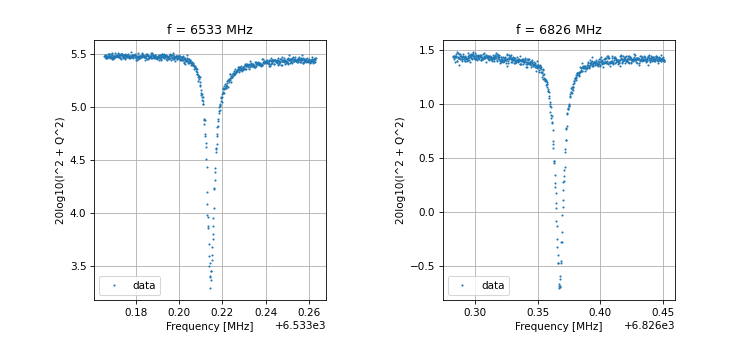

Saving data-2024-03-09-17-33-13
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 13.774 s


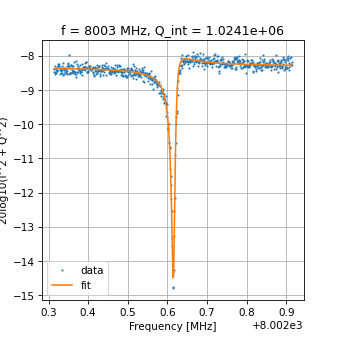

Frequencies out are: [8002.616862636525] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 41.118 s


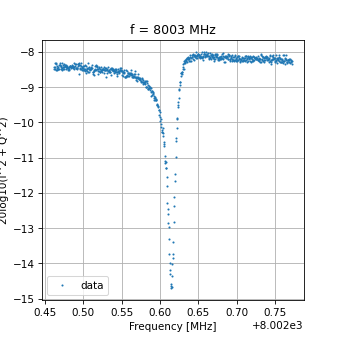

Saving data-2024-03-09-17-34-19
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.948 s


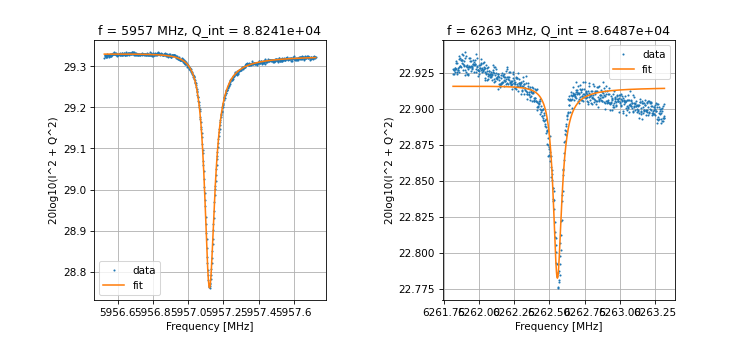

Frequencies out are: [5957.118876484223, 6262.555332578264] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 52.529 s


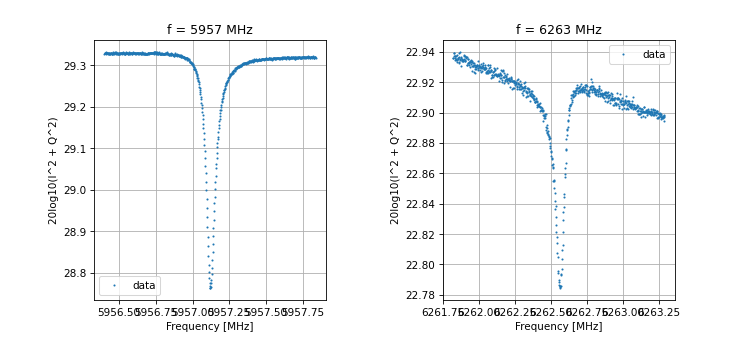

Saving data-2024-03-09-17-35-18
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 17.553 s


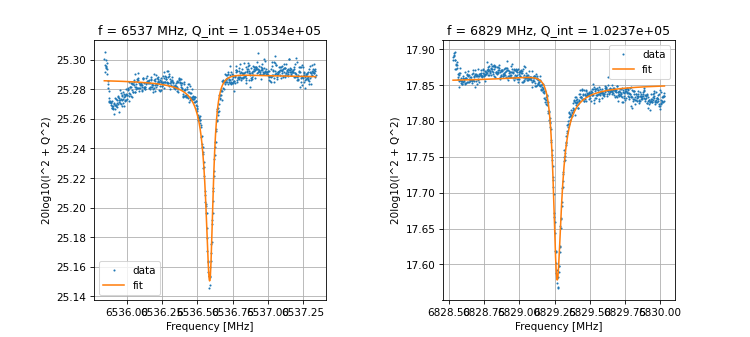

Frequencies out are: [6536.591355455979, 6829.263539209605] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 50.495 s


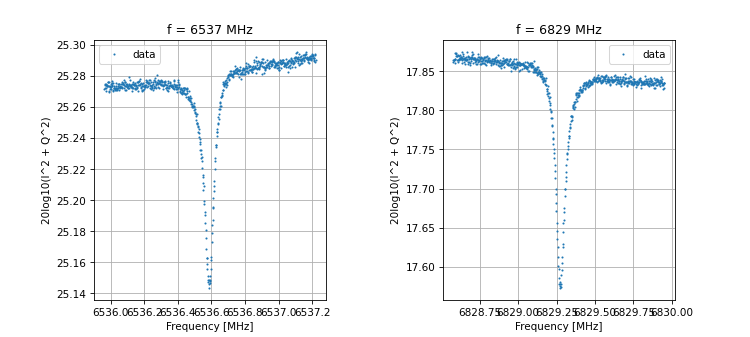

 32%|███▏      | 6/19 [4:32:03<9:49:32, 2720.97s/it] 

Saving data-2024-03-09-17-36-30
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.581 s


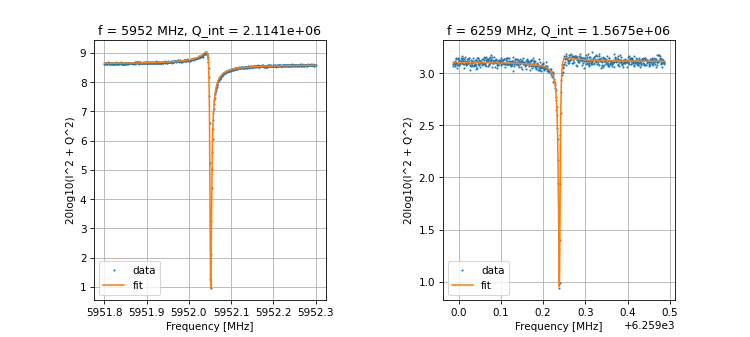

Frequencies out are: [5952.0504276461, 6259.238737702406] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 48.371 s


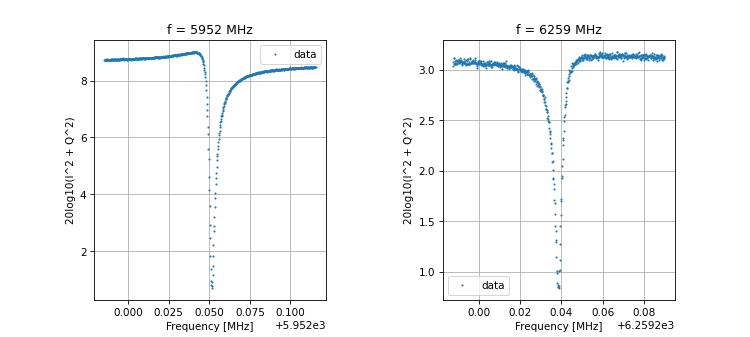

Saving data-2024-03-09-18-17-39
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.327 s


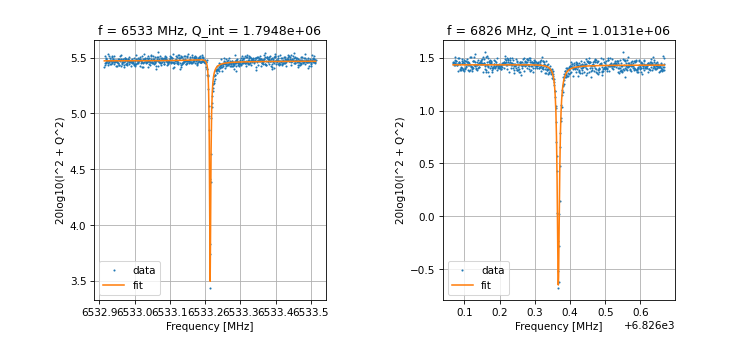

Frequencies out are: [6533.214153959483, 6826.366686177751] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 48.557 s


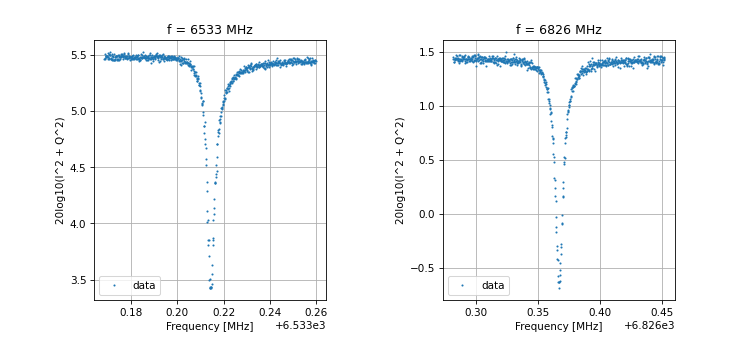

Saving data-2024-03-09-18-18-45
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 13.425 s


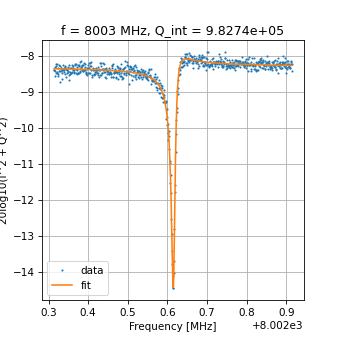

Frequencies out are: [8002.616828105315] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 39.945 s


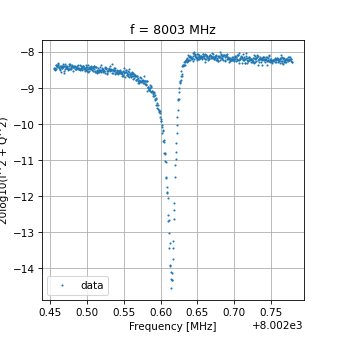

Saving data-2024-03-09-18-19-48
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.306 s


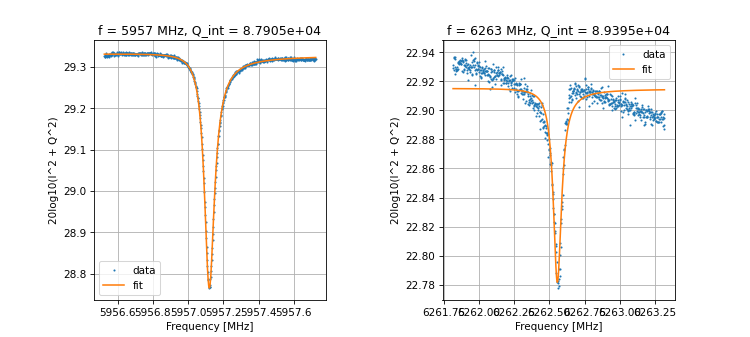

Frequencies out are: [5957.117823170678, 6262.5560261750215] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 48.306 s


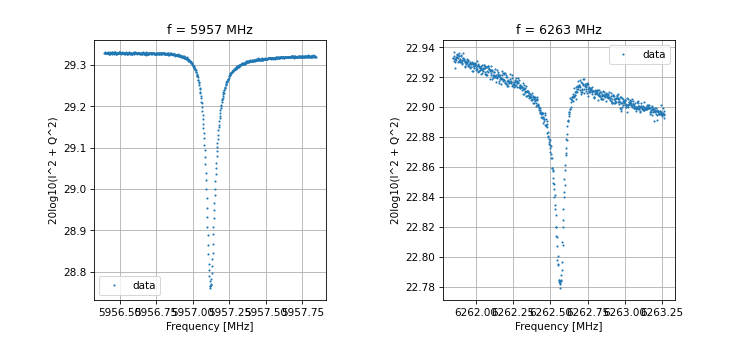

Saving data-2024-03-09-18-20-46
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.345 s


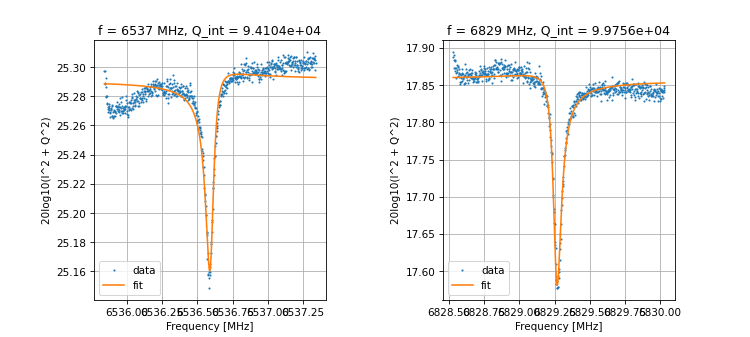

Frequencies out are: [6536.594164699408, 6829.263991728036] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 47.919 s


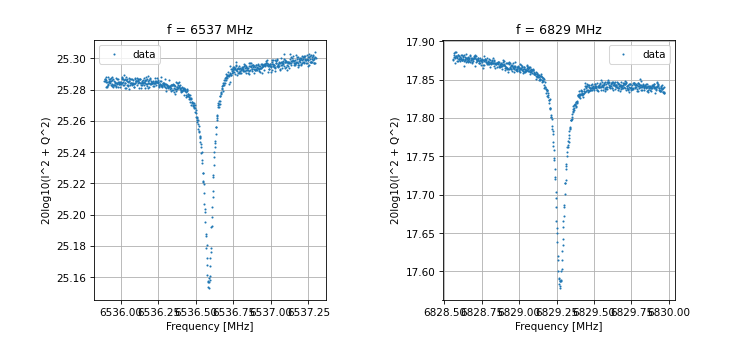

 37%|███▋      | 7/19 [5:17:22<9:04:05, 2720.45s/it]

Saving data-2024-03-09-18-21-52
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.534 s


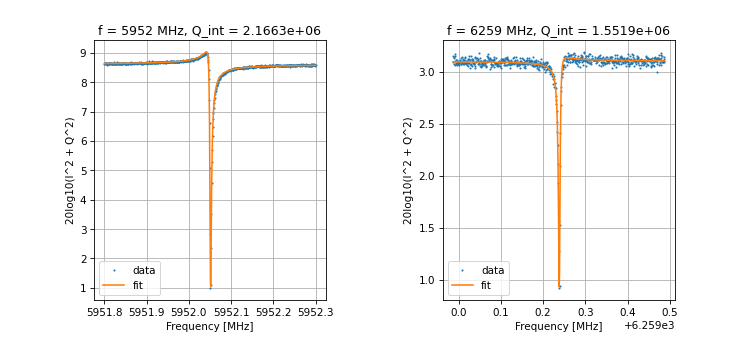

Frequencies out are: [5952.050332556752, 6259.238573764775] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.497 s


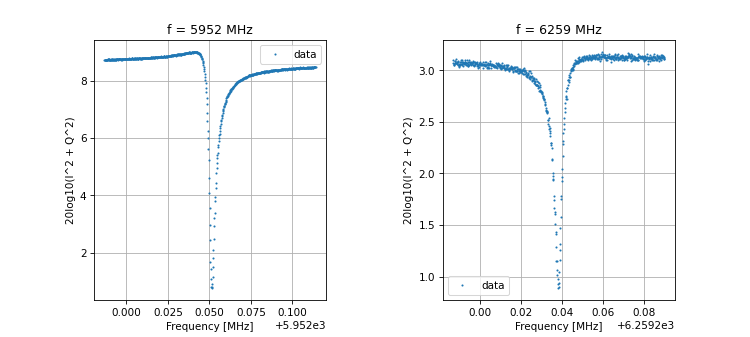

Saving data-2024-03-09-19-02-57
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.603 s


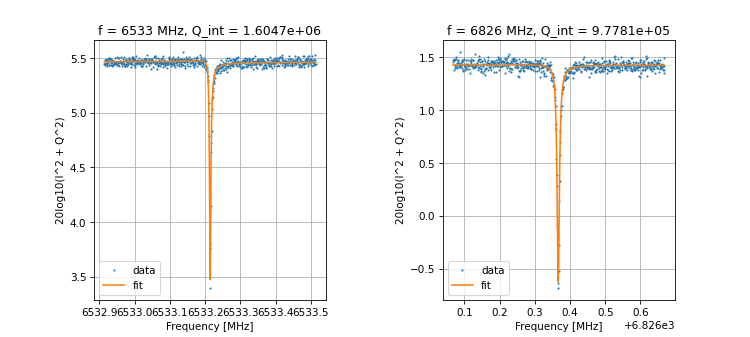

Frequencies out are: [6533.21416827125, 6826.366358132833] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.713 s


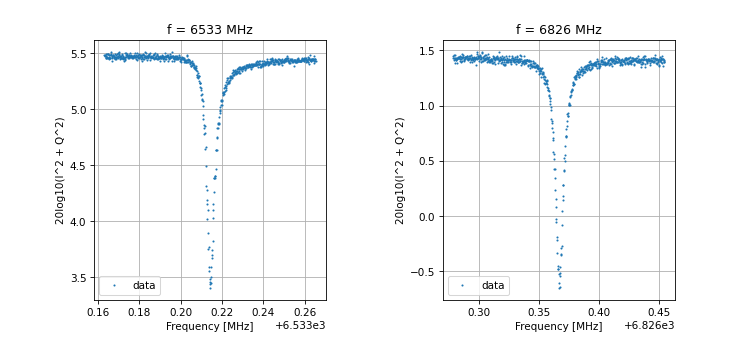

Saving data-2024-03-09-19-04-00
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.859 s


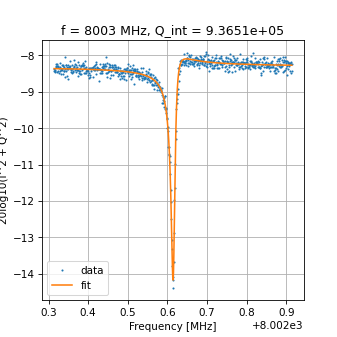

Frequencies out are: [8002.6163345209] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.616 s


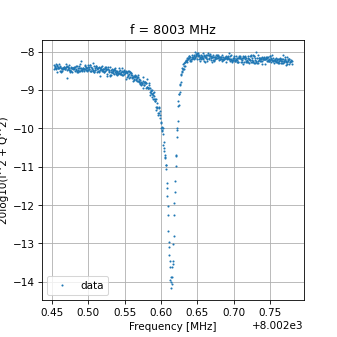

Saving data-2024-03-09-19-05-01
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.560 s


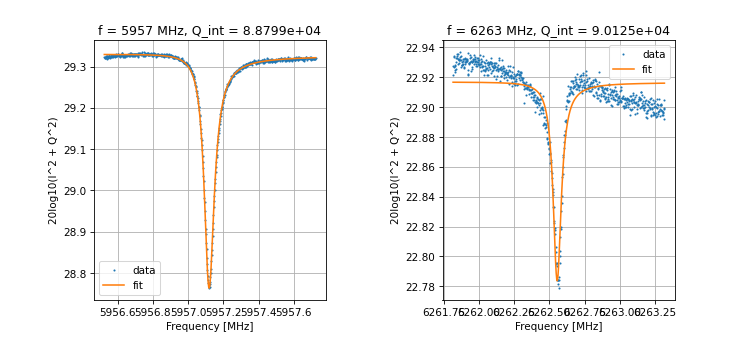

Frequencies out are: [5957.116866469798, 6262.554887933329] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.663 s


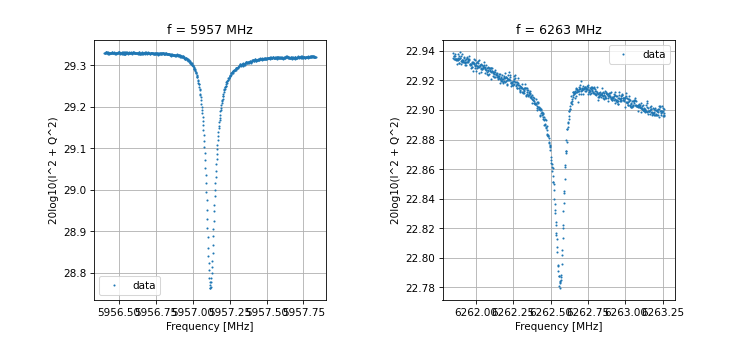

Saving data-2024-03-09-19-05-57
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.514 s


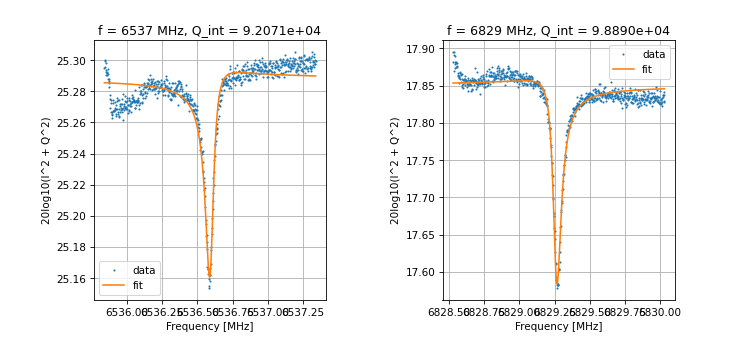

Frequencies out are: [6536.593482215024, 6829.262395403251] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.190 s


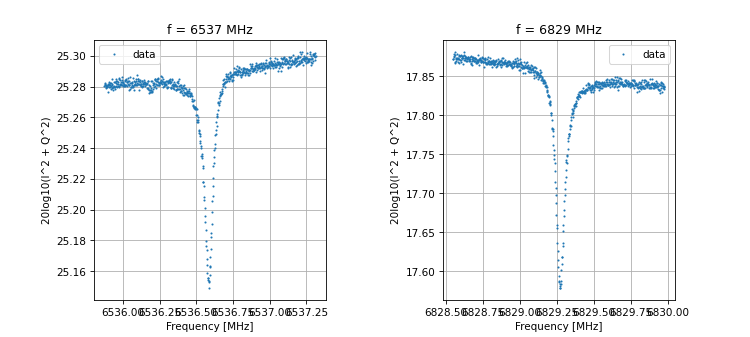

 42%|████▏     | 8/19 [6:02:29<8:17:56, 2716.07s/it]

Saving data-2024-03-09-19-07-00
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.480 s


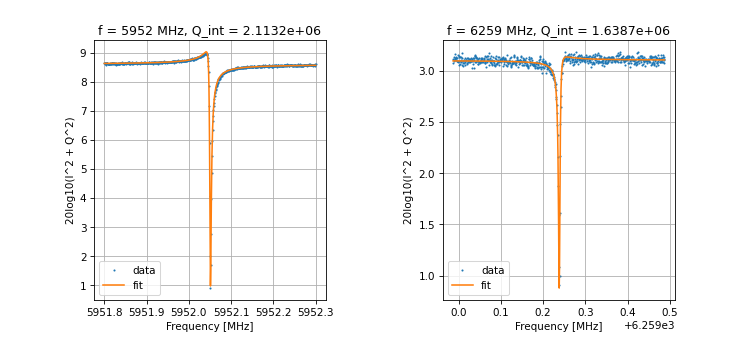

Frequencies out are: [5952.050009942739, 6259.2384703003445] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.455 s


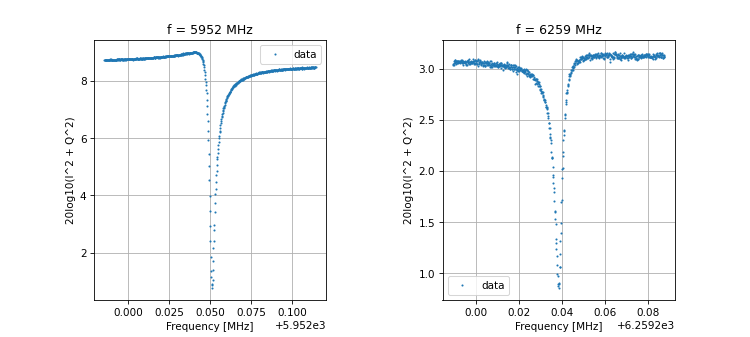

Saving data-2024-03-09-19-48-04
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.710 s


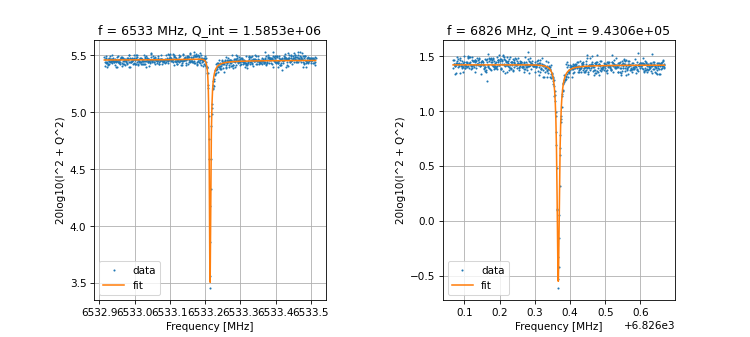

Frequencies out are: [6533.213942722702, 6826.366340132551] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.786 s


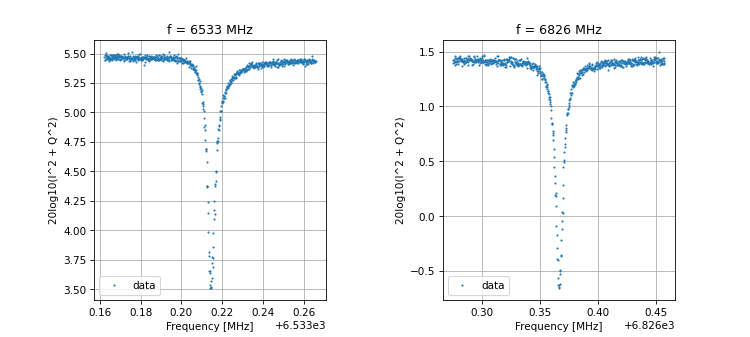

Saving data-2024-03-09-19-49-08
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.912 s


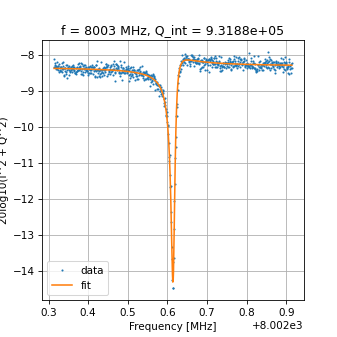

Frequencies out are: [8002.615993785435] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.687 s


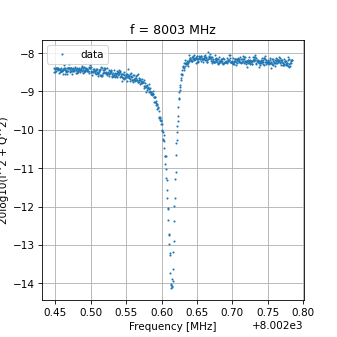

Saving data-2024-03-09-19-50-09
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.413 s


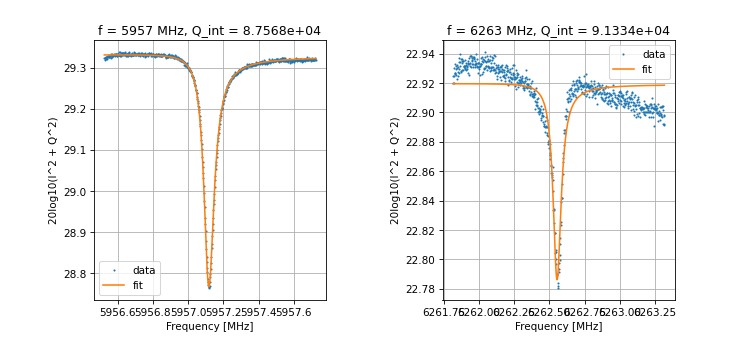

Frequencies out are: [5957.115271579701, 6262.553598754943] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.321 s


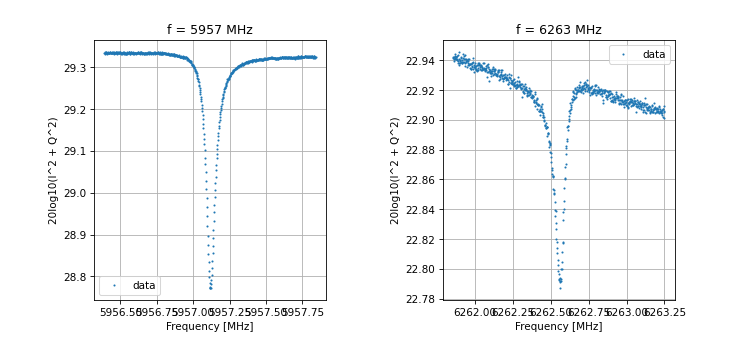

Saving data-2024-03-09-19-51-04
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.500 s


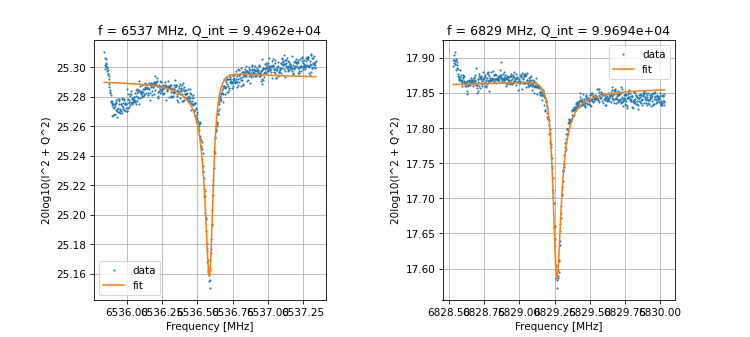

Frequencies out are: [6536.590744839024, 6829.261458983706] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.146 s


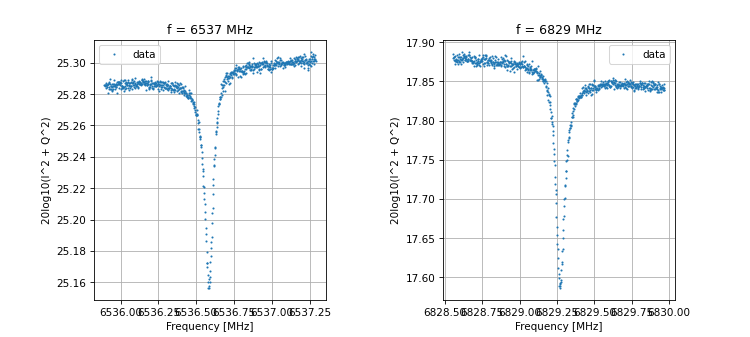

 47%|████▋     | 9/19 [6:47:36<7:32:12, 2713.29s/it]

Saving data-2024-03-09-19-52-08
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.477 s


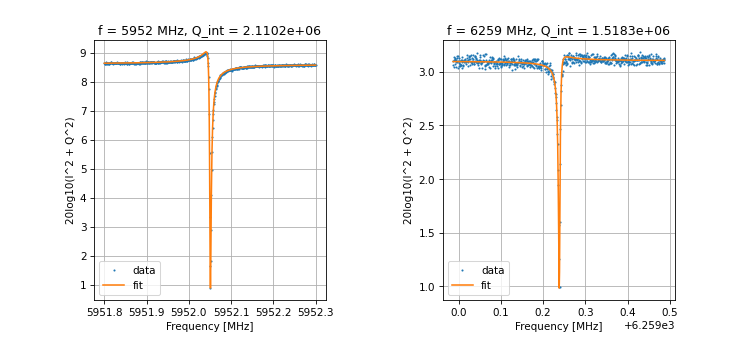

Frequencies out are: [5952.04985702636, 6259.238552282148] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.485 s


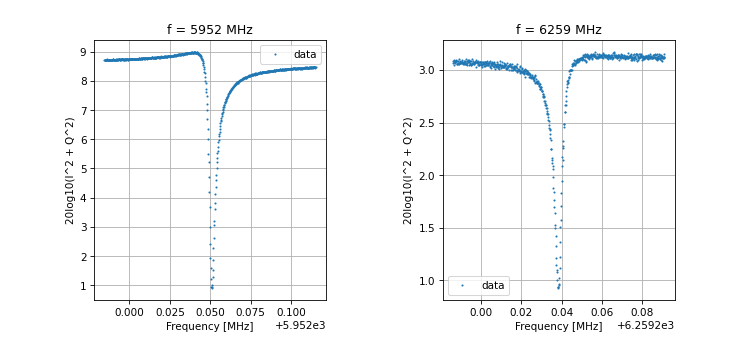

Saving data-2024-03-09-20-33-11
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.356 s


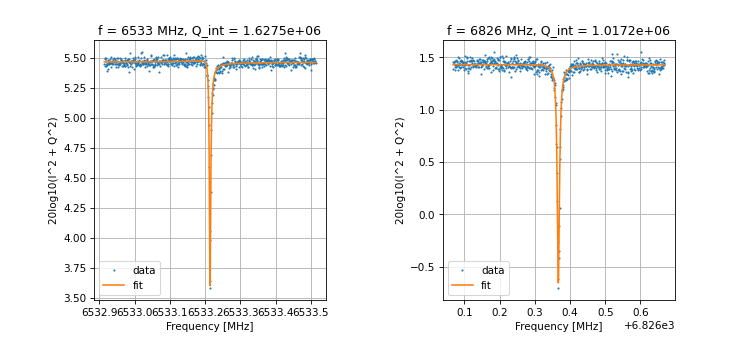

Frequencies out are: [6533.213834858742, 6826.366749365926] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.423 s


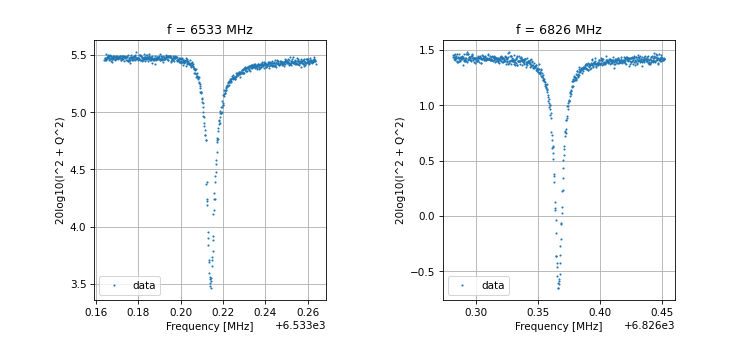

Saving data-2024-03-09-20-34-14
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.896 s


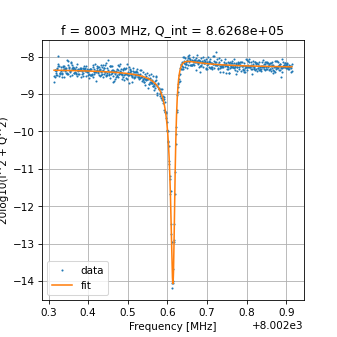

Frequencies out are: [8002.616005047593] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.374 s


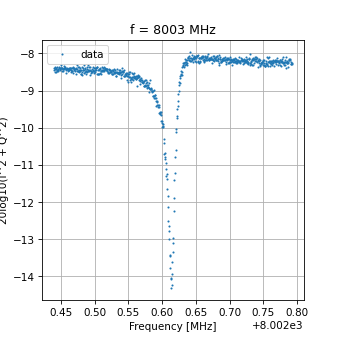

Saving data-2024-03-09-20-35-15
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.233 s


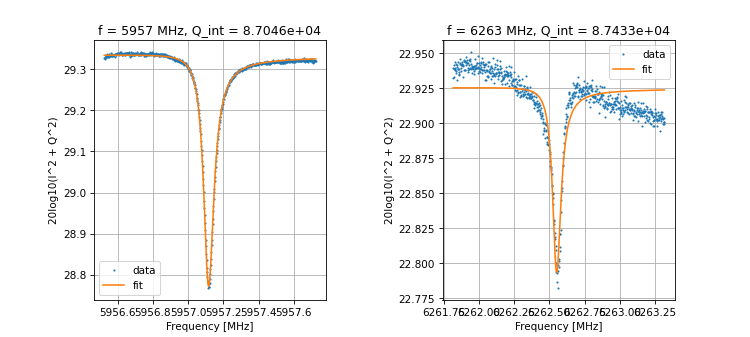

Frequencies out are: [5957.11365334847, 6262.5501963245615] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.136 s


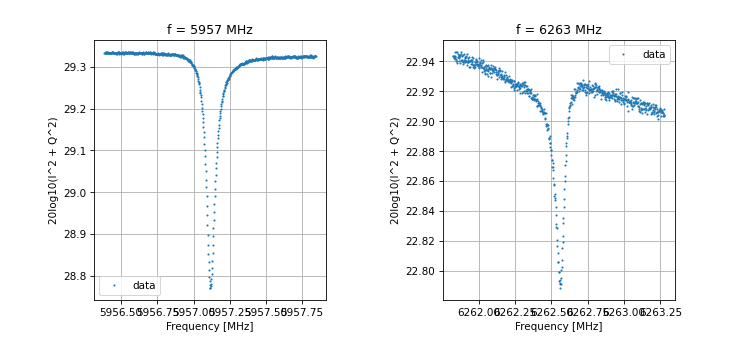

Saving data-2024-03-09-20-36-10
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.339 s


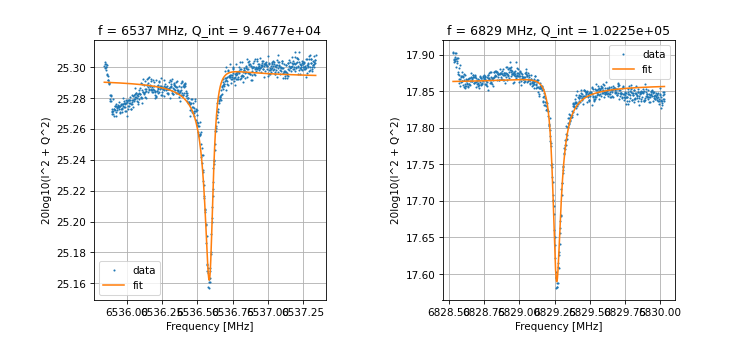

Frequencies out are: [6536.590900612243, 6829.260884727828] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.191 s


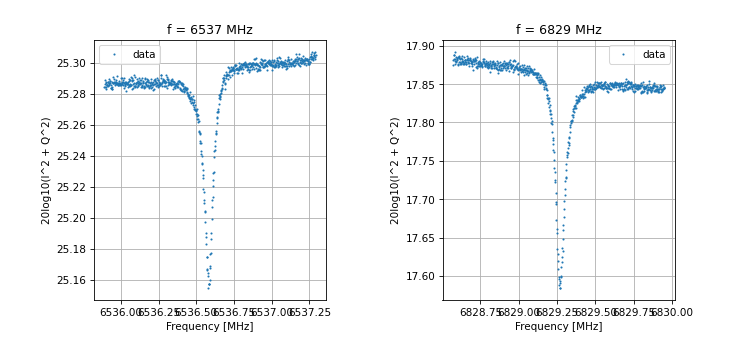

 53%|█████▎    | 10/19 [7:32:41<6:46:37, 2710.79s/it]

Saving data-2024-03-09-20-37-13
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.123 s


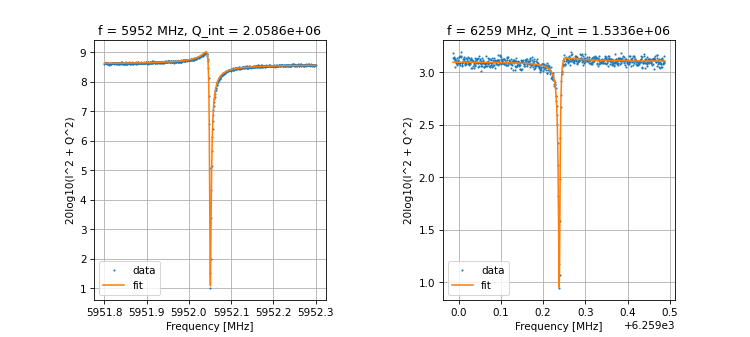

Frequencies out are: [5952.049712357993, 6259.2385439735235] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.230 s


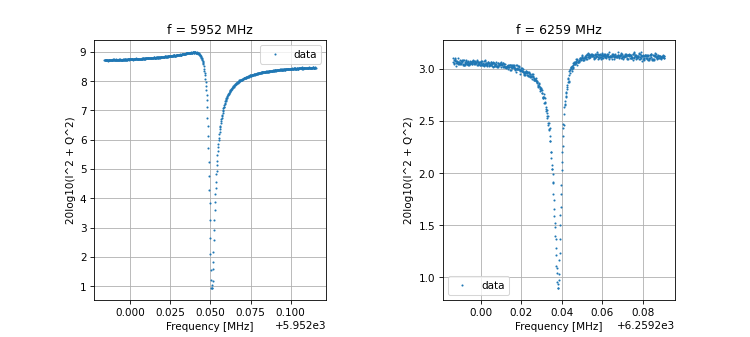

Saving data-2024-03-09-21-18-17
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.423 s


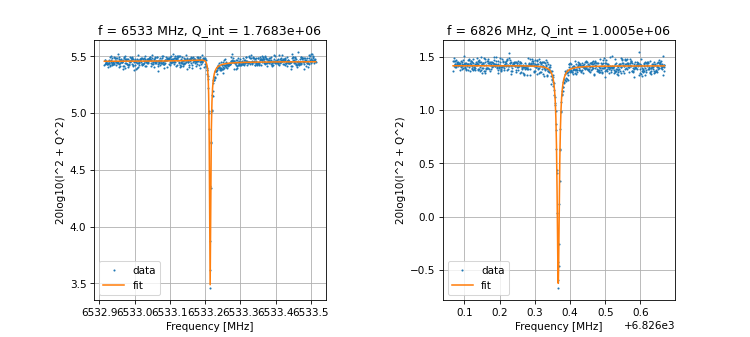

Frequencies out are: [6533.2140832663445, 6826.366444334653] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.457 s


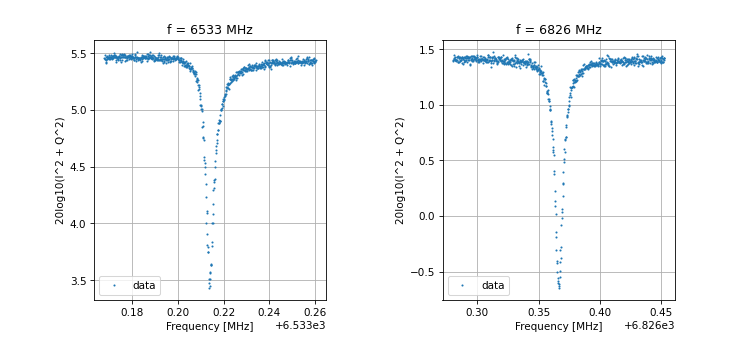

Saving data-2024-03-09-21-19-20
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.917 s


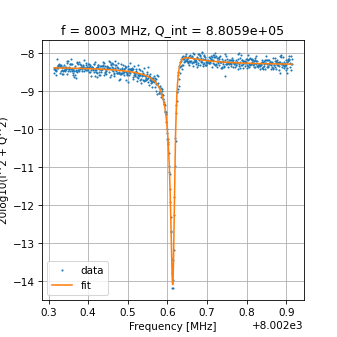

Frequencies out are: [8002.615505055712] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.599 s


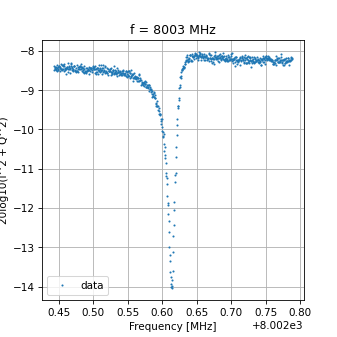

Saving data-2024-03-09-21-20-20
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.307 s


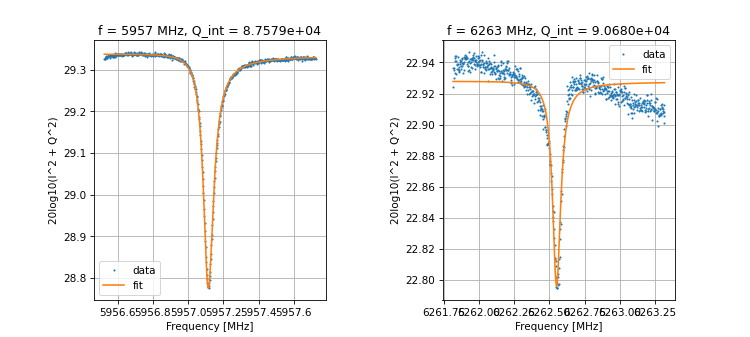

Frequencies out are: [5957.11244415542, 6262.550334760665] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.190 s


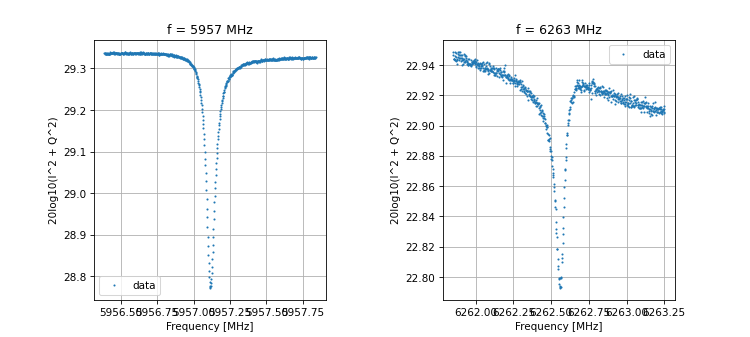

Saving data-2024-03-09-21-21-16
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.426 s


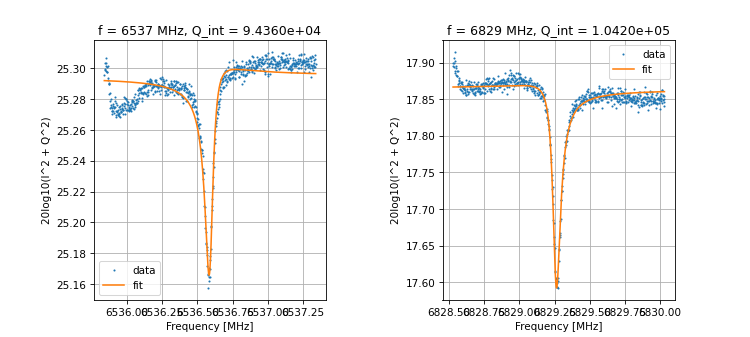

Frequencies out are: [6536.590199146689, 6829.260035640148] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.300 s


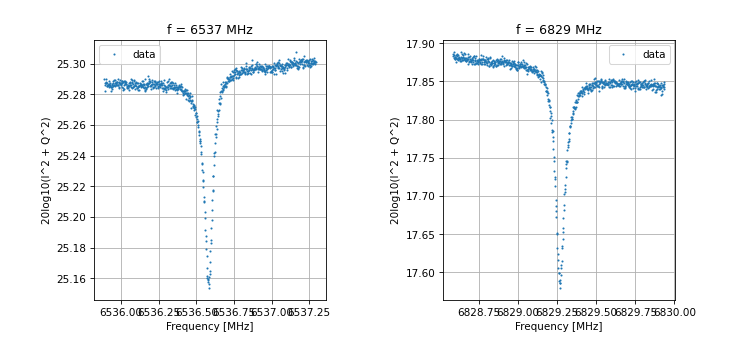

 58%|█████▊    | 11/19 [8:17:48<6:01:16, 2709.52s/it]

Saving data-2024-03-09-21-22-19
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.544 s


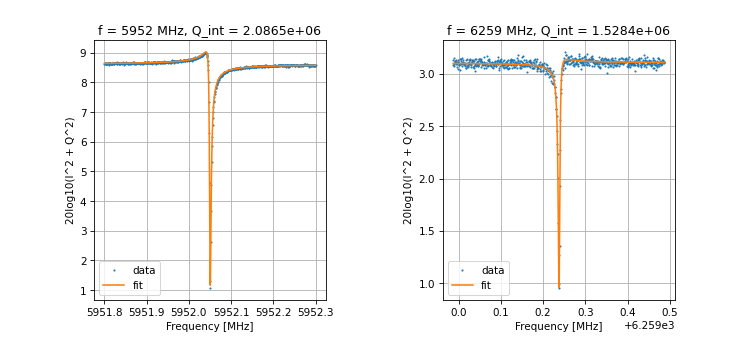

Frequencies out are: [5952.049498887104, 6259.238014987193] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.233 s


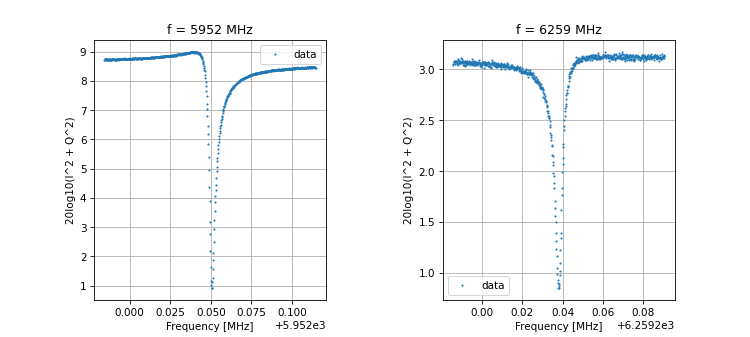

Saving data-2024-03-09-22-03-23
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.397 s


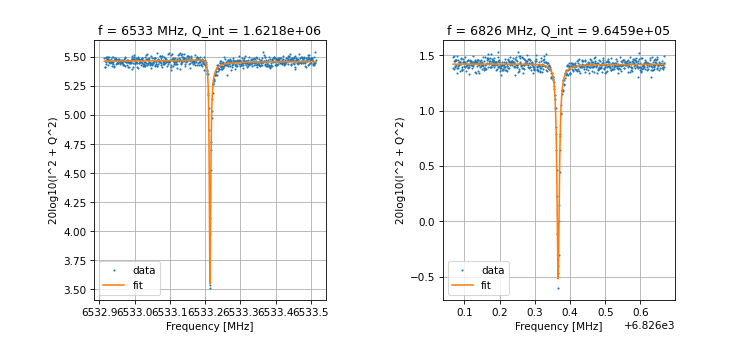

Frequencies out are: [6533.213664024454, 6826.366083764663] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.324 s


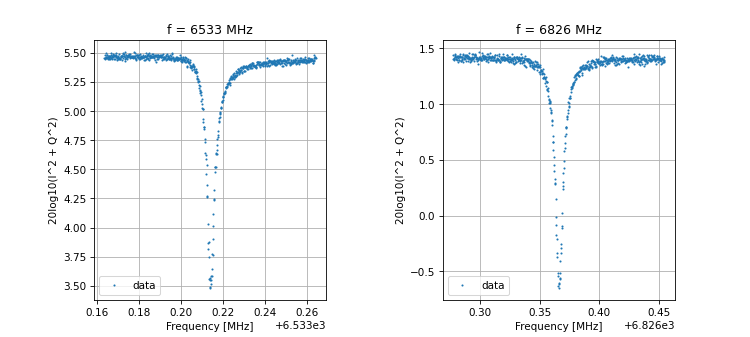

Saving data-2024-03-09-22-04-26
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.837 s


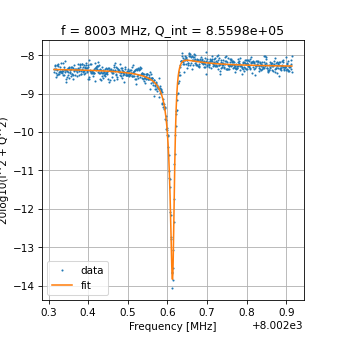

Frequencies out are: [8002.614852397531] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.412 s


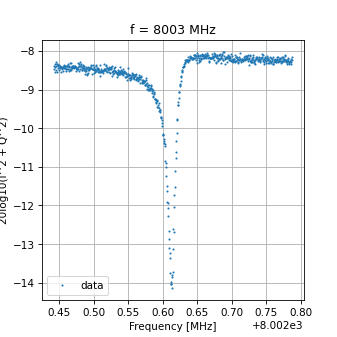

Saving data-2024-03-09-22-05-27
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.375 s


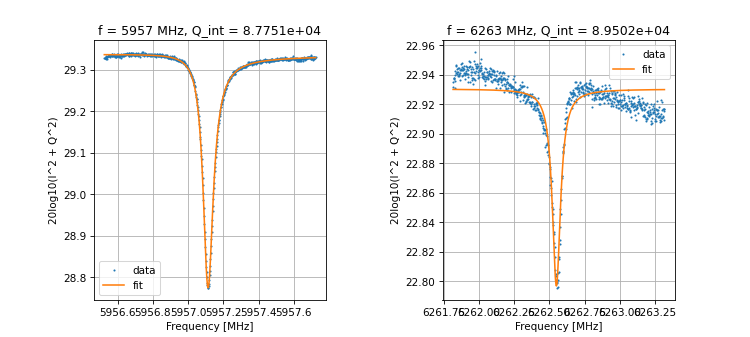

Frequencies out are: [5957.111080062292, 6262.54998908682] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.237 s


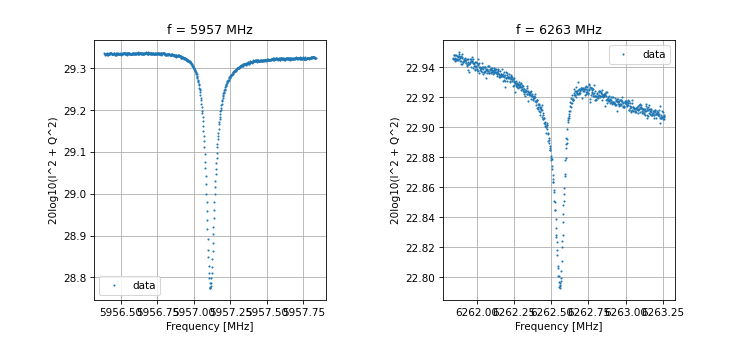

Saving data-2024-03-09-22-06-22
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.500 s


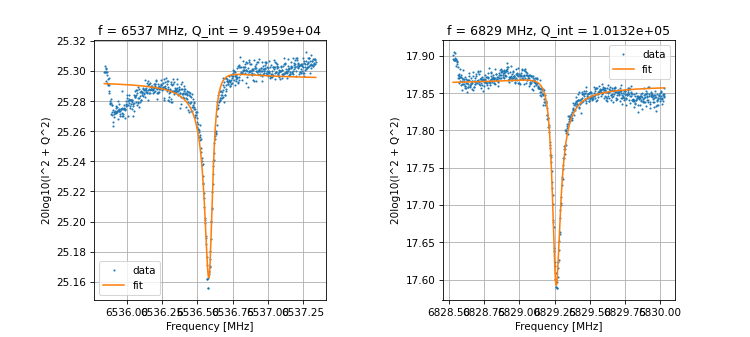

Frequencies out are: [6536.587033911166, 6829.256759977236] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.316 s


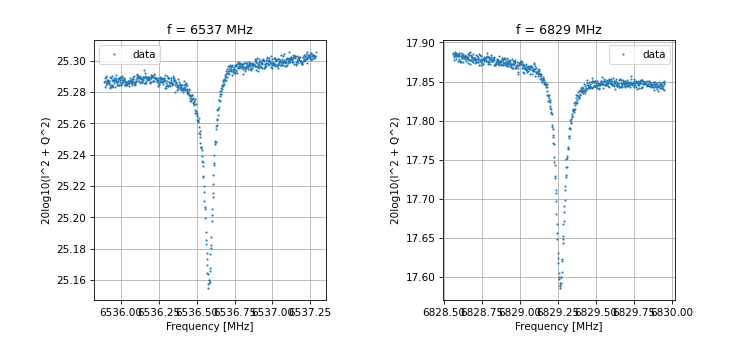

 63%|██████▎   | 12/19 [9:02:54<5:15:59, 2708.48s/it]

Saving data-2024-03-09-22-07-25
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.018 s


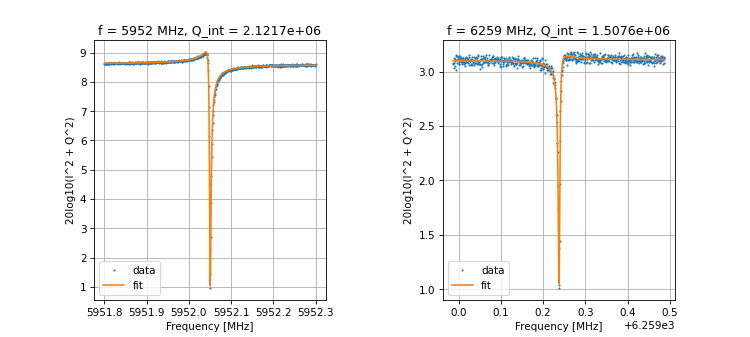

Frequencies out are: [5952.049410952357, 6259.2380419354995] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 44.978 s


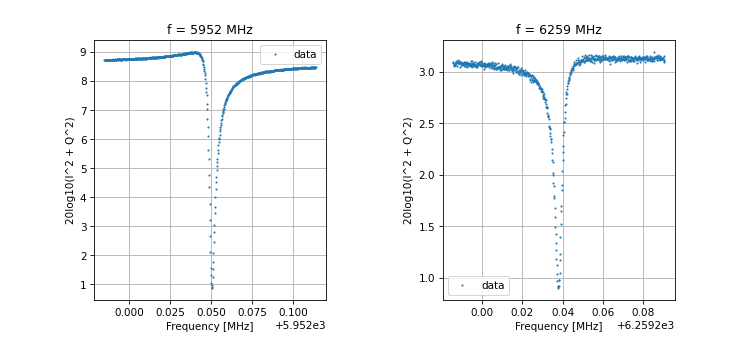

Saving data-2024-03-09-22-48-28
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.092 s


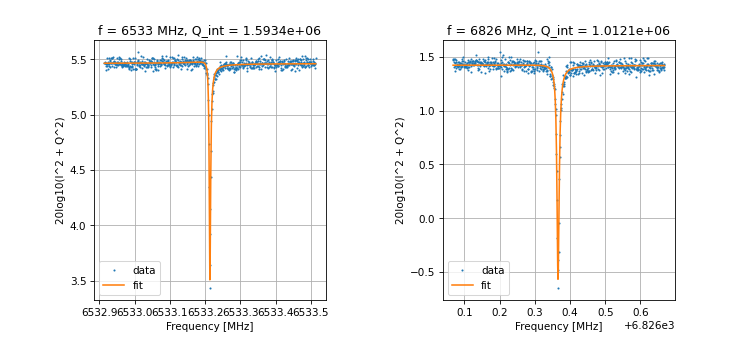

Frequencies out are: [6533.213510726103, 6826.365829637253] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 45.366 s


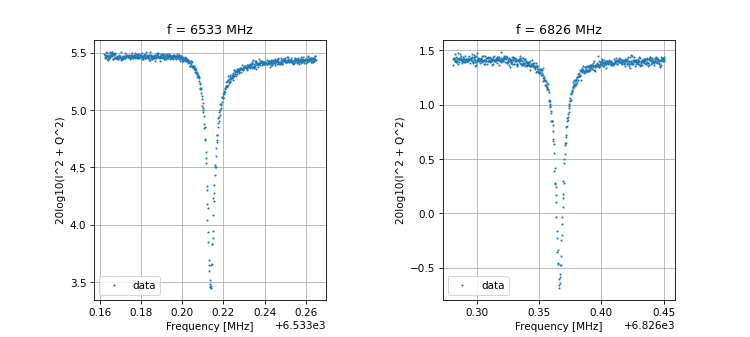

Saving data-2024-03-09-22-49-30
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.551 s


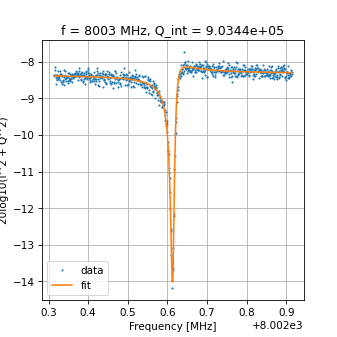

Frequencies out are: [8002.614823082702] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 37.579 s


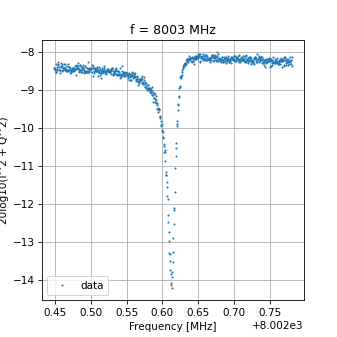

Saving data-2024-03-09-22-50-30
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.089 s


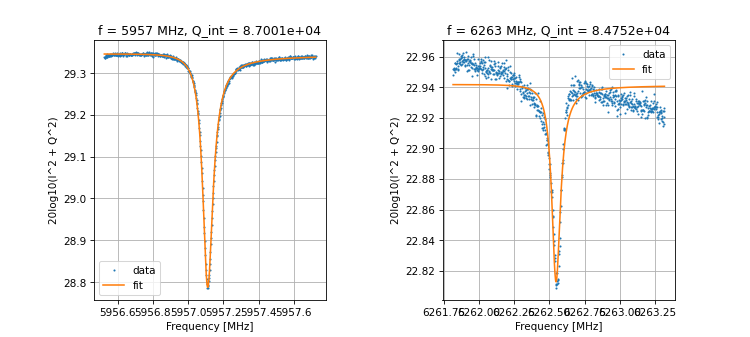

Frequencies out are: [5957.108885370908, 6262.5463228062445] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 45.058 s


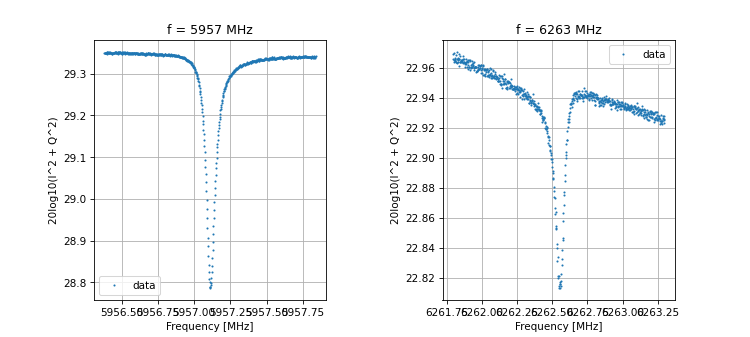

Saving data-2024-03-09-22-51-24
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.134 s


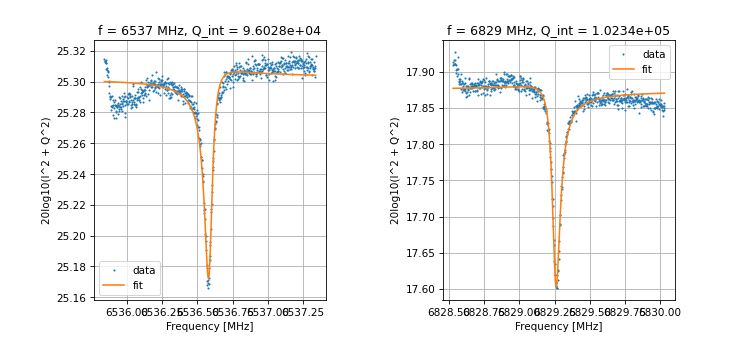

Frequencies out are: [6536.5849843901005, 6829.25689890125] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 45.335 s


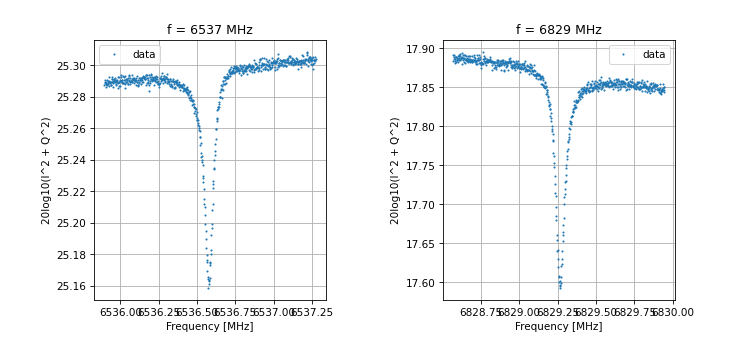

 68%|██████▊   | 13/19 [9:47:54<4:30:34, 2705.77s/it]

Saving data-2024-03-09-22-52-26
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.380 s


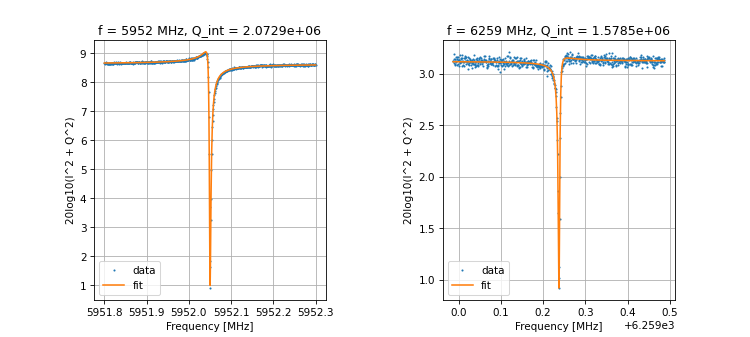

Frequencies out are: [5952.049148594948, 6259.2378368132795] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.136 s


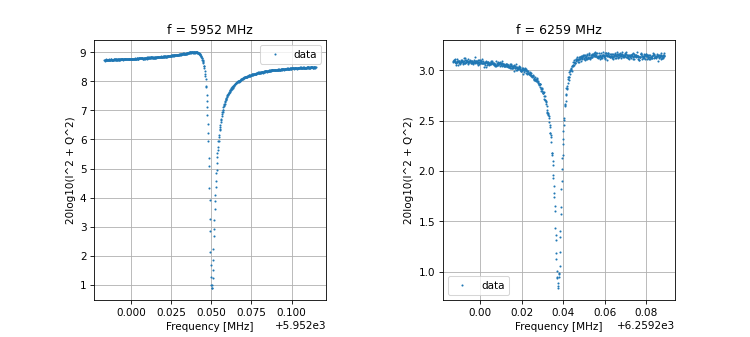

Saving data-2024-03-09-23-33-28
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.480 s


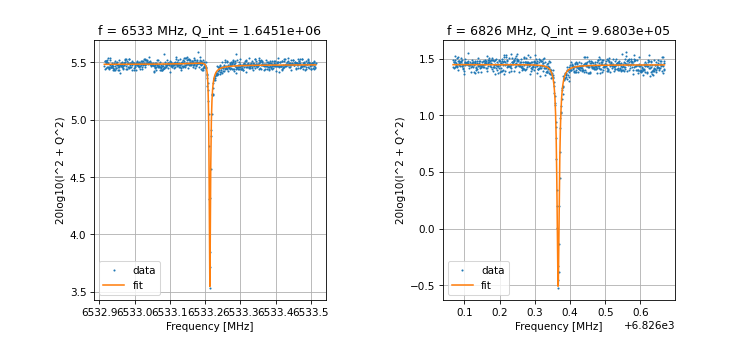

Frequencies out are: [6533.213264469087, 6826.366115182543] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.420 s


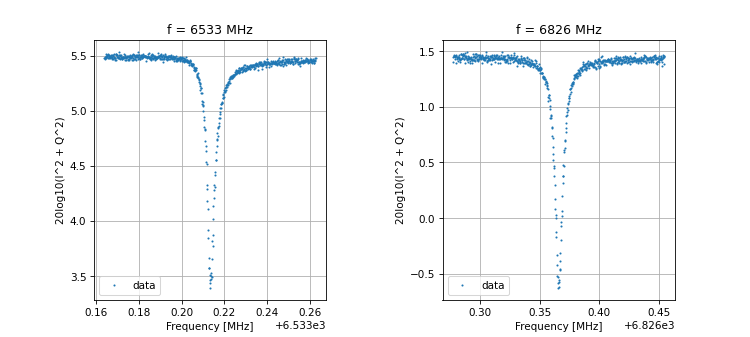

Saving data-2024-03-09-23-34-31
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.823 s


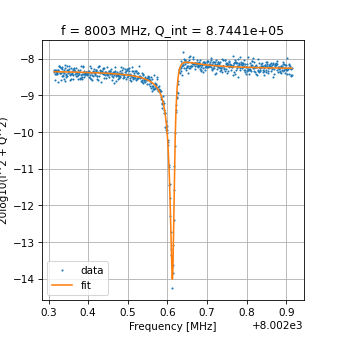

Frequencies out are: [8002.614626034677] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.405 s


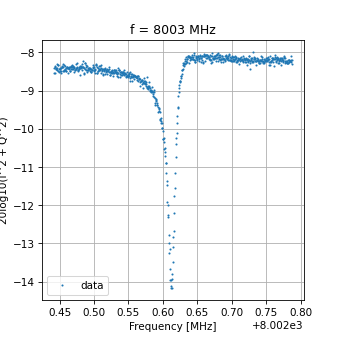

Saving data-2024-03-09-23-35-32
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.336 s


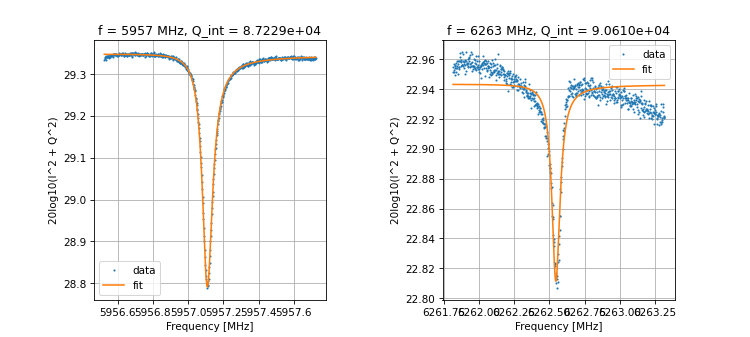

Frequencies out are: [5957.106872948717, 6262.545541172753] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.184 s


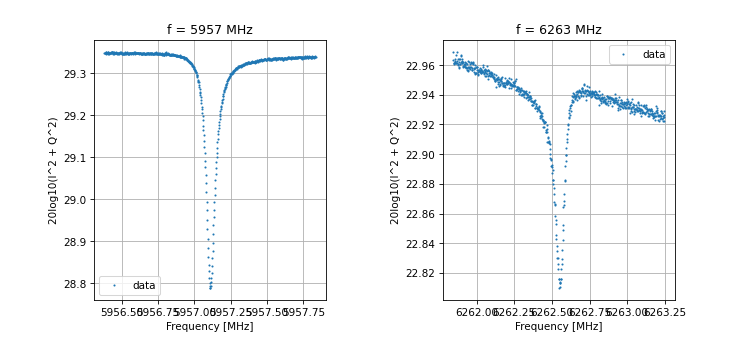

Saving data-2024-03-09-23-36-27
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.456 s


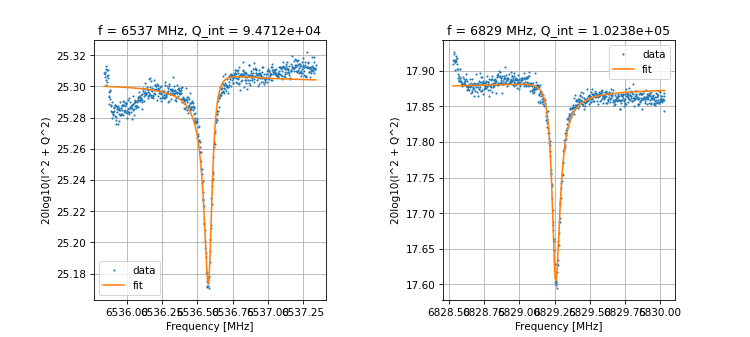

Frequencies out are: [6536.583290310519, 6829.254763049627] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.614 s


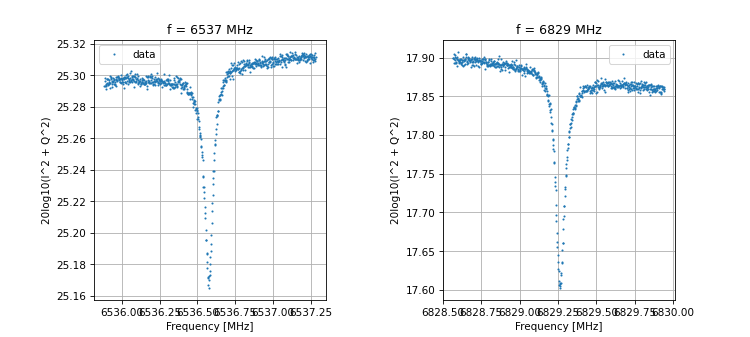

 74%|███████▎  | 14/19 [10:32:59<3:45:28, 2705.72s/it]

Saving data-2024-03-09-23-37-30
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.538 s


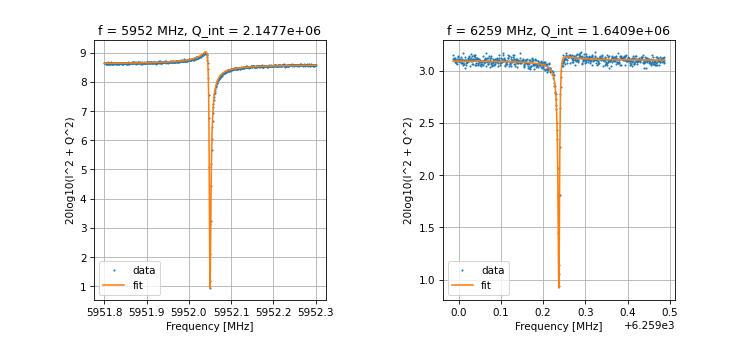

Frequencies out are: [5952.048991710829, 6259.237569300265] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.731 s


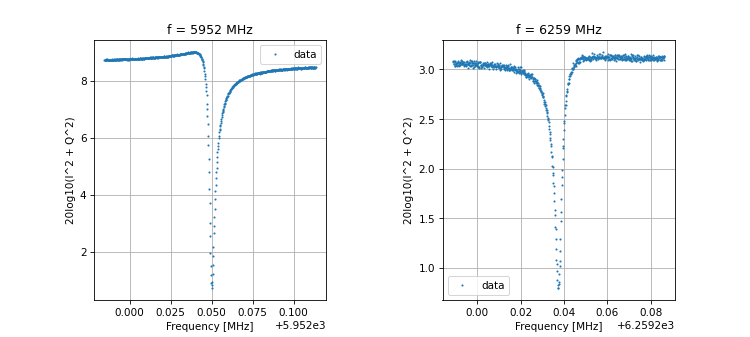

Saving data-2024-03-10-00-18-34
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.592 s


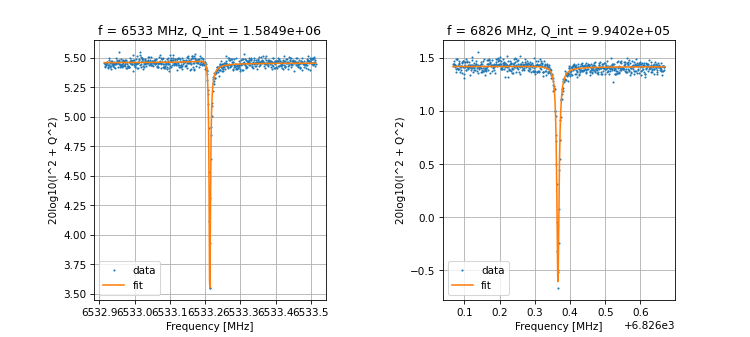

Frequencies out are: [6533.21301380268, 6826.365501757175] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.603 s


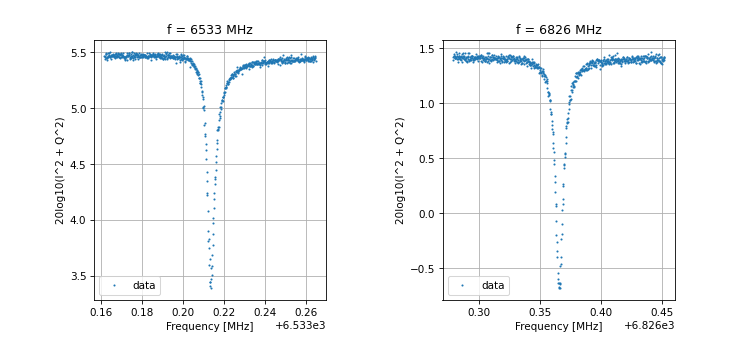

Saving data-2024-03-10-00-19-38
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.844 s


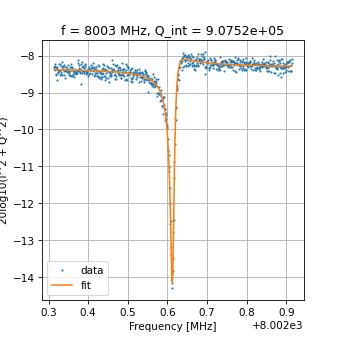

Frequencies out are: [8002.614567127754] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.662 s


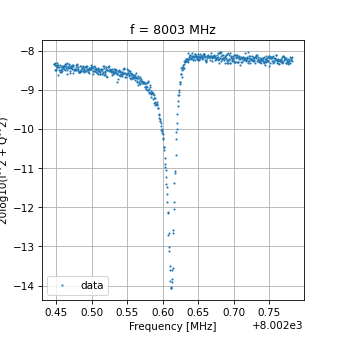

Saving data-2024-03-10-00-20-38
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.400 s


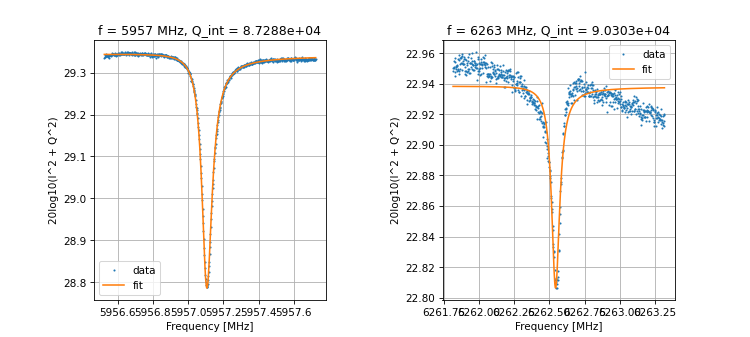

Frequencies out are: [5957.1040365710005, 6262.543147207448] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.467 s


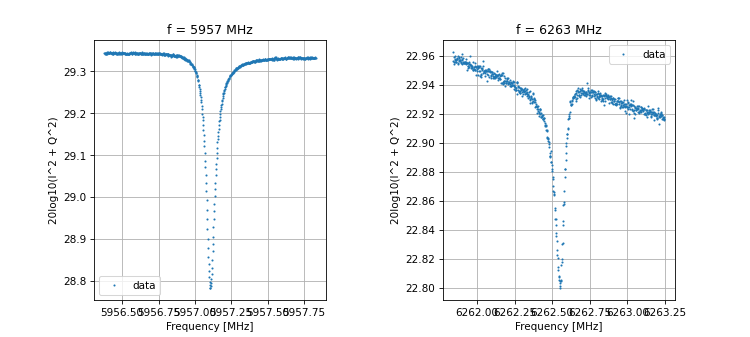

Saving data-2024-03-10-00-21-34
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.410 s


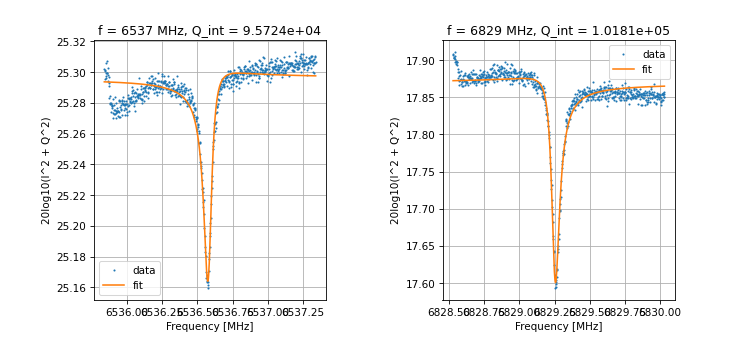

Frequencies out are: [6536.579859159012, 6829.25165152921] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.426 s


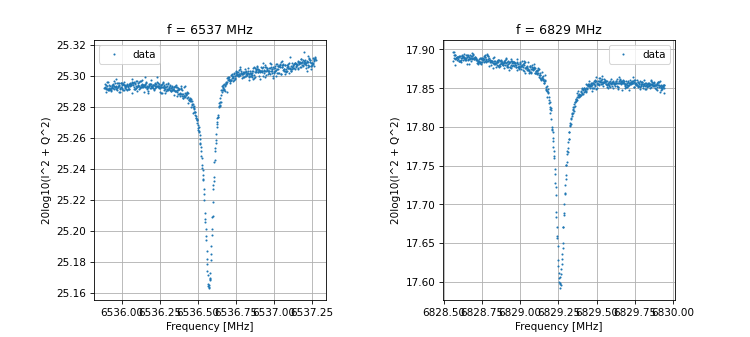

 79%|███████▉  | 15/19 [11:18:06<3:00:24, 2706.03s/it]

Saving data-2024-03-10-00-22-37
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 16.057 s


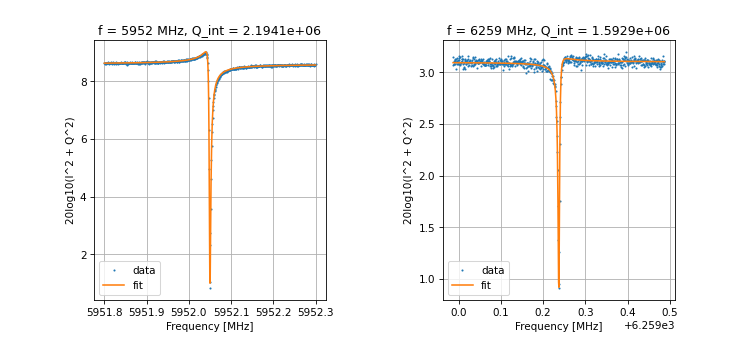

Frequencies out are: [5952.04887056974, 6259.237445125008] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.380 s


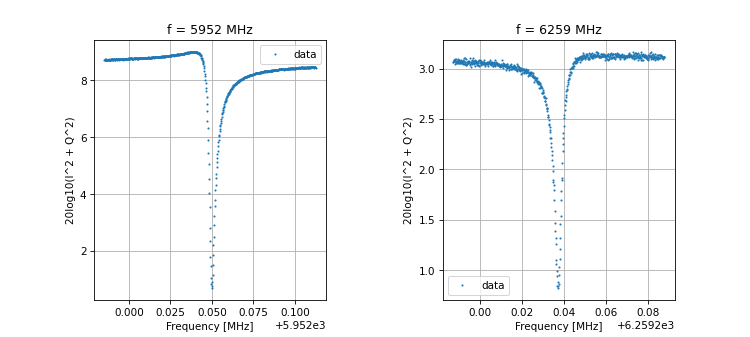

Saving data-2024-03-10-01-03-41
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.345 s


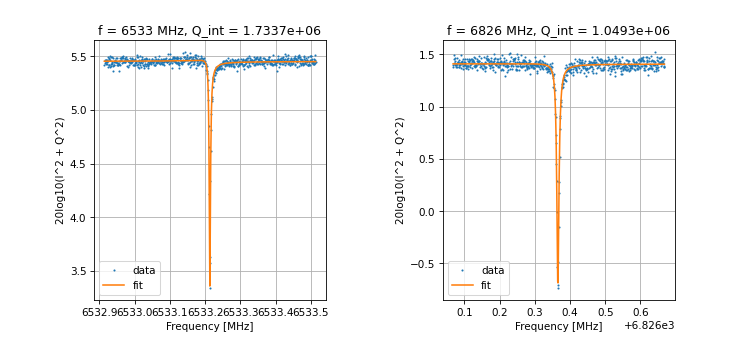

Frequencies out are: [6533.213243806598, 6826.365338584082] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.253 s


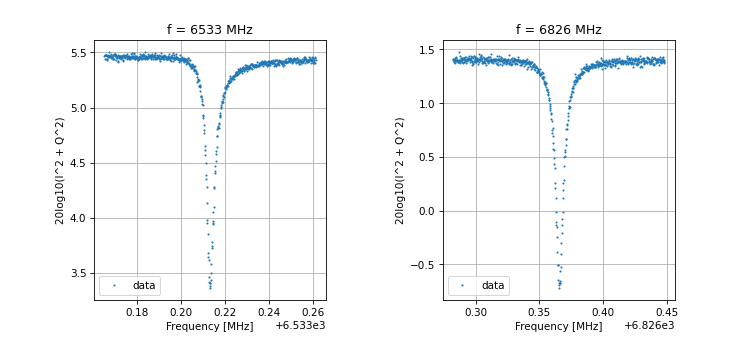

Saving data-2024-03-10-01-04-44
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.815 s


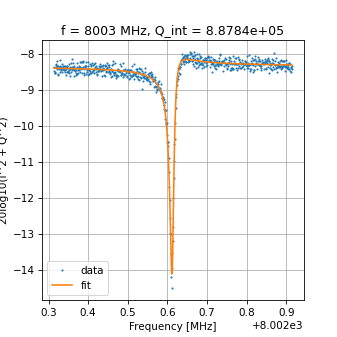

Frequencies out are: [8002.613422391125] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.495 s


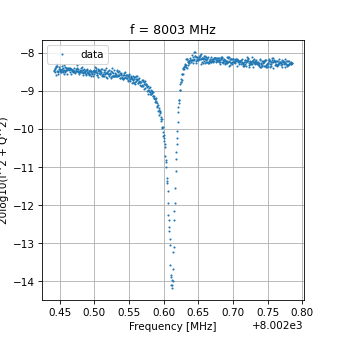

Saving data-2024-03-10-01-05-45
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.341 s


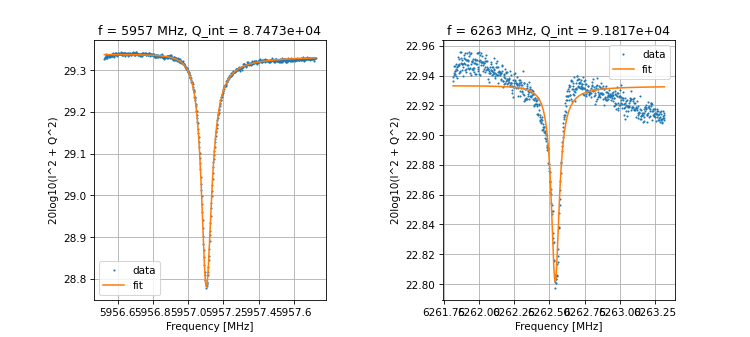

Frequencies out are: [5957.1011542689475, 6262.5408795519925] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.080 s


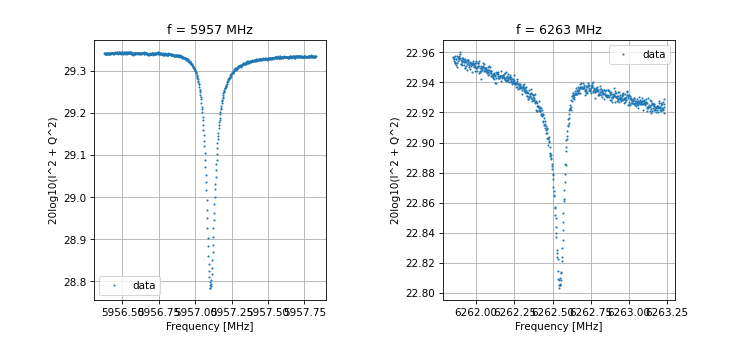

Saving data-2024-03-10-01-06-40
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.358 s


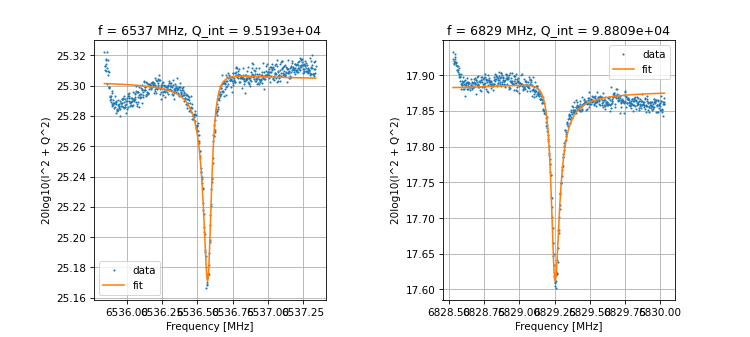

Frequencies out are: [6536.577886091179, 6829.248912123672] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.066 s


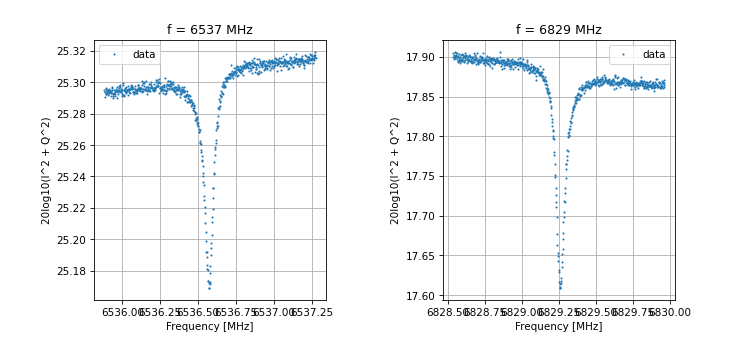

 84%|████████▍ | 16/19 [12:03:11<2:15:17, 2705.84s/it]

Saving data-2024-03-10-01-07-43
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.126 s


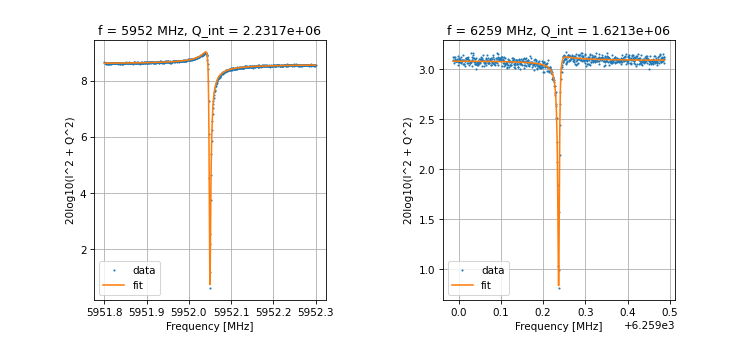

Frequencies out are: [5952.048717376873, 6259.23704846153] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.399 s


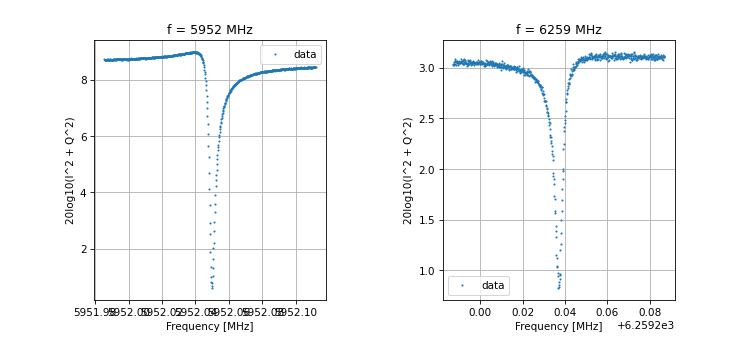

Saving data-2024-03-10-01-48-46
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.473 s


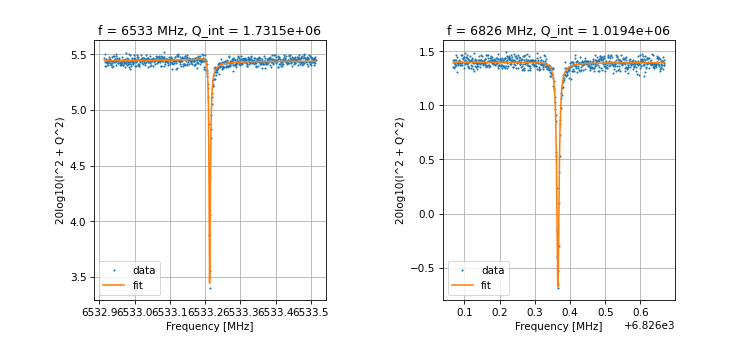

Frequencies out are: [6533.212741940466, 6826.365432003808] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.413 s


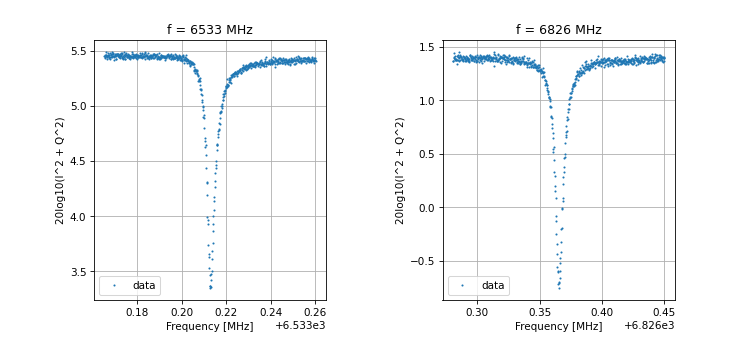

Saving data-2024-03-10-01-49-49
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.794 s


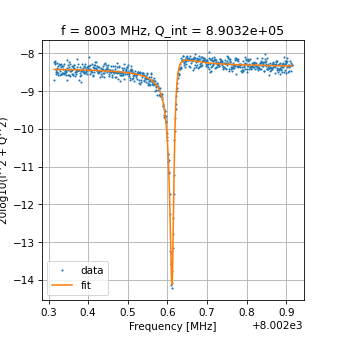

Frequencies out are: [8002.6134888938905] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.441 s


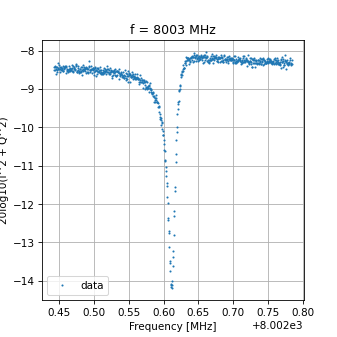

Saving data-2024-03-10-01-50-50
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.374 s


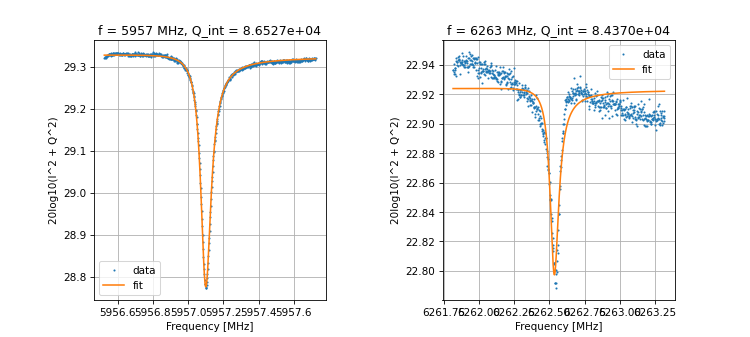

Frequencies out are: [5957.09763631671, 6262.533131077077] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.260 s


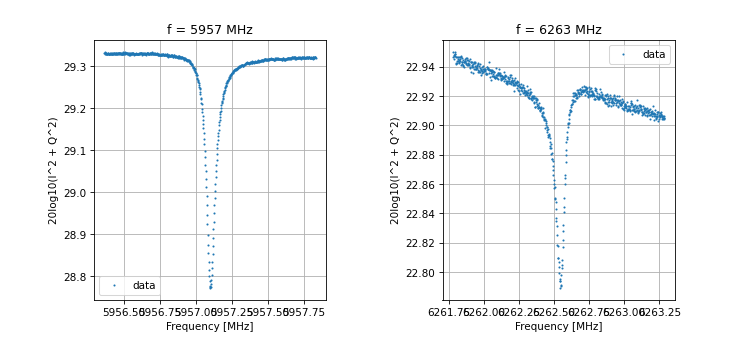

Saving data-2024-03-10-01-51-45
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.427 s


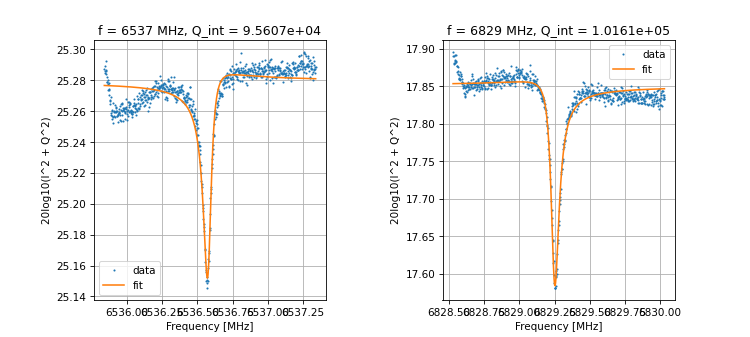

Frequencies out are: [6536.577944246045, 6829.248184128737] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.197 s


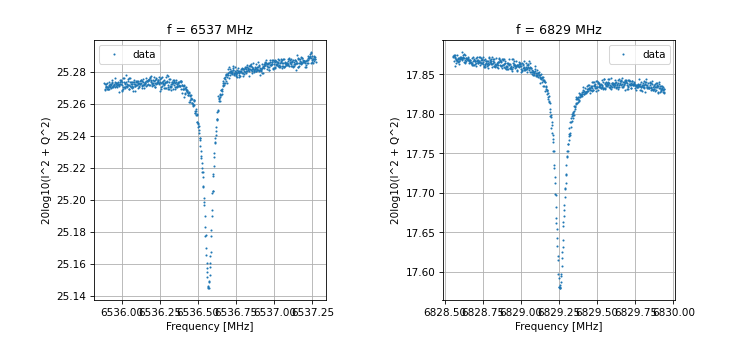

 89%|████████▉ | 17/19 [12:48:17<1:30:11, 2705.71s/it]

Saving data-2024-03-10-01-52-48
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.455 s


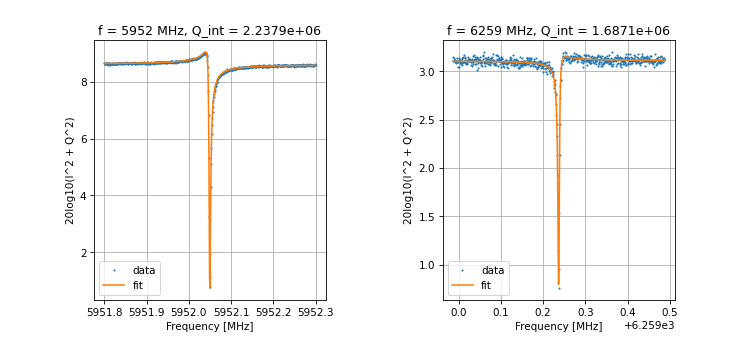

Frequencies out are: [5952.048325494575, 6259.237089679788] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.223 s


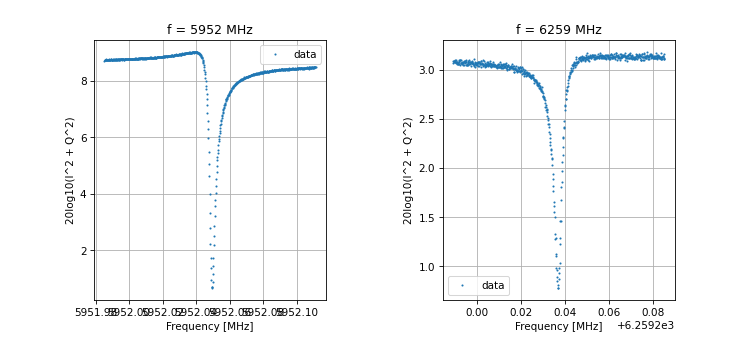

Saving data-2024-03-10-03-33-51
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.349 s


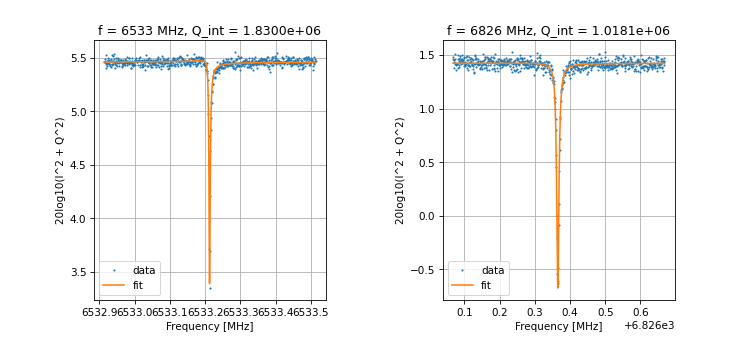

Frequencies out are: [6533.212541231581, 6826.3651921555165] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.386 s


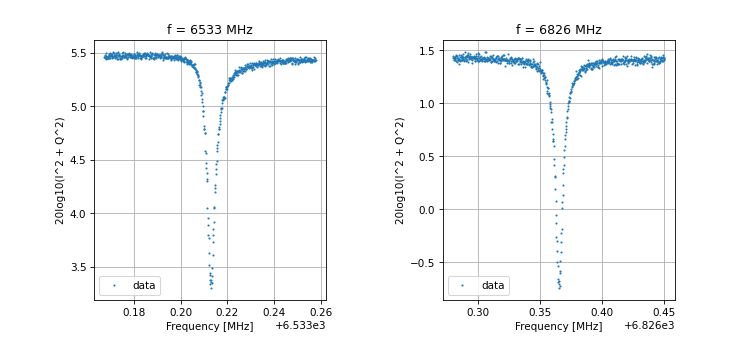

Saving data-2024-03-10-03-34-54
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.835 s


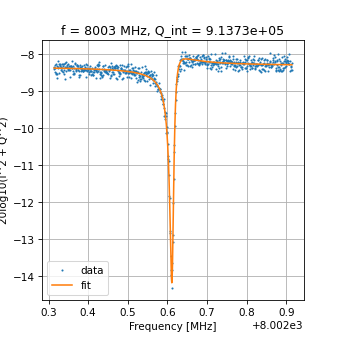

Frequencies out are: [8002.613179888554] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.347 s


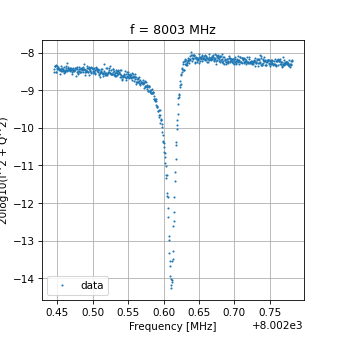

Saving data-2024-03-10-03-35-55
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.344 s


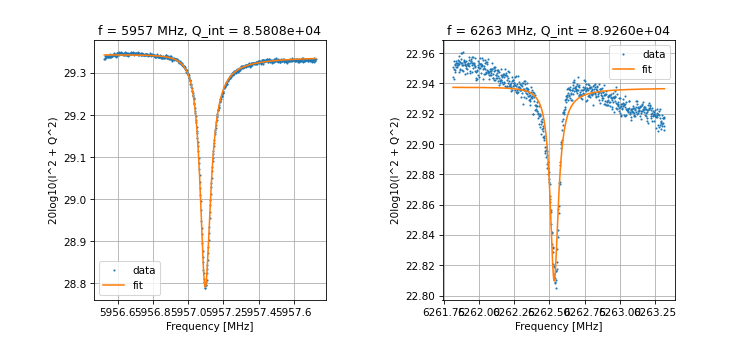

Frequencies out are: [5957.094570385491, 6262.533330730505] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.470 s


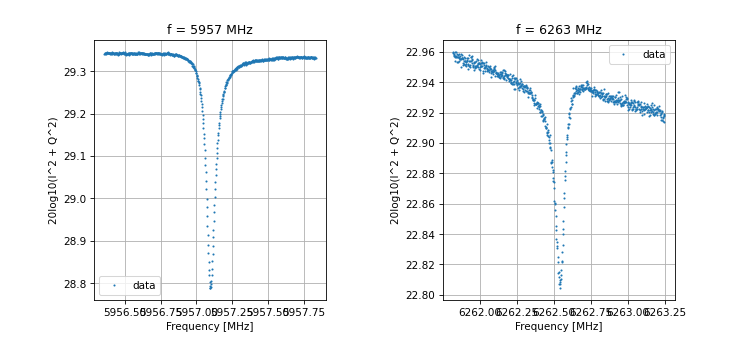

Saving data-2024-03-10-03-36-50
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.538 s


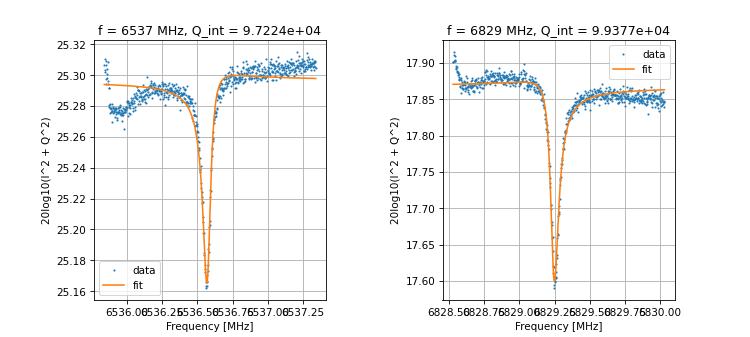

Frequencies out are: [6536.573145065277, 6829.244236275241] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.647 s


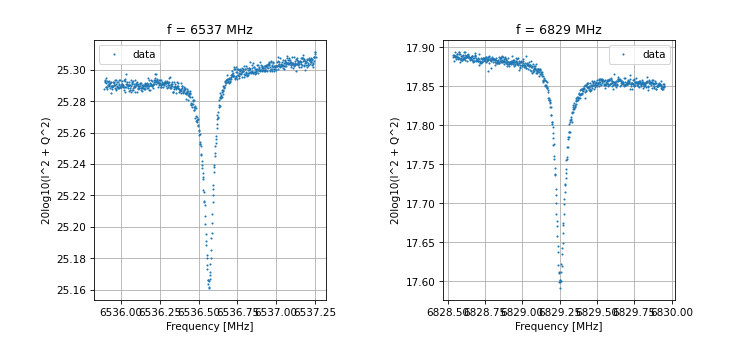

 95%|█████████▍| 18/19 [13:33:23<45:05, 2705.80s/it]  

Saving data-2024-03-10-03-37-54
Frequencies out are: [5952.05, 6259.237] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.396 s


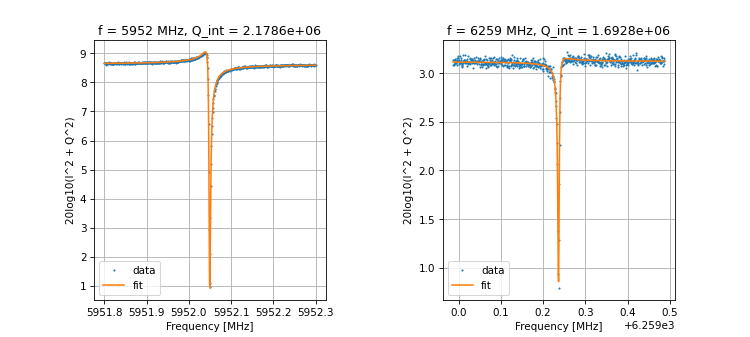

Frequencies out are: [5952.048220454521, 6259.236718401098] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.579 s


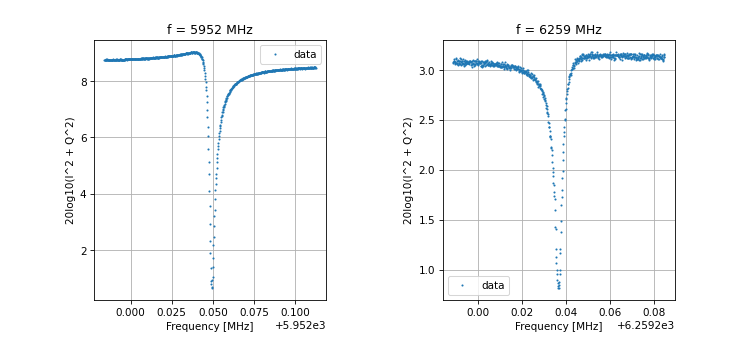

Saving data-2024-03-10-04-18-57
Frequencies out are: [6533.214, 6826.368] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.561 s


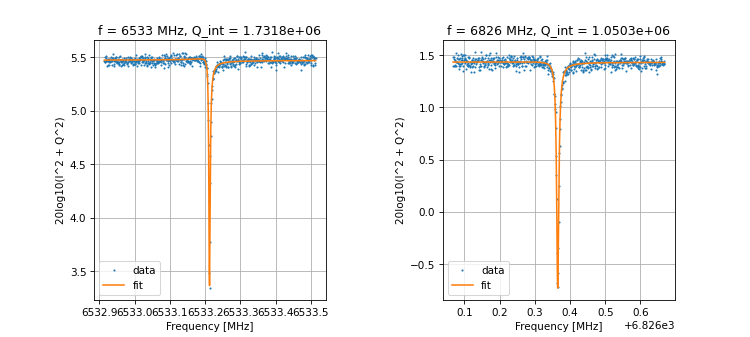

Frequencies out are: [6533.212290134699, 6826.364853299304] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.588 s


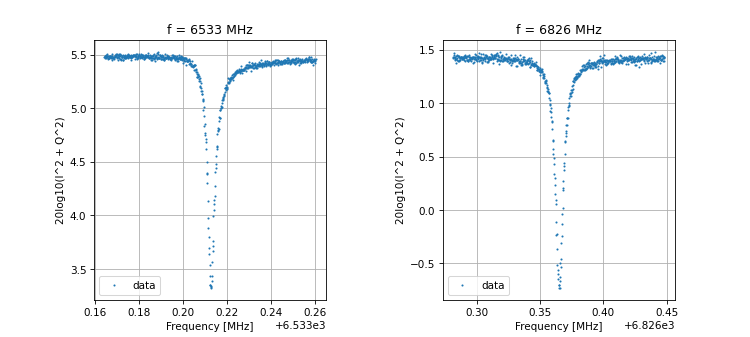

Saving data-2024-03-10-04-20-02
Frequencies out are: [8002.614] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 12.904 s


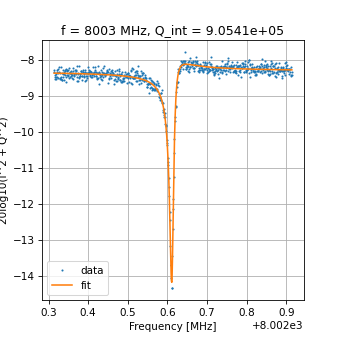

Frequencies out are: [8002.6128397723505] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 38.609 s


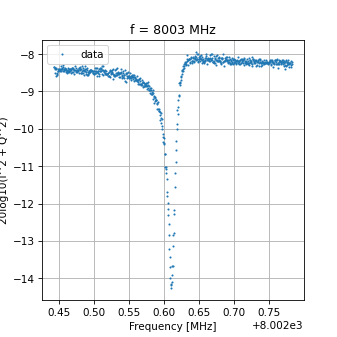

Saving data-2024-03-10-04-21-03
Frequencies out are: [5957.124, 6262.567] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.432 s


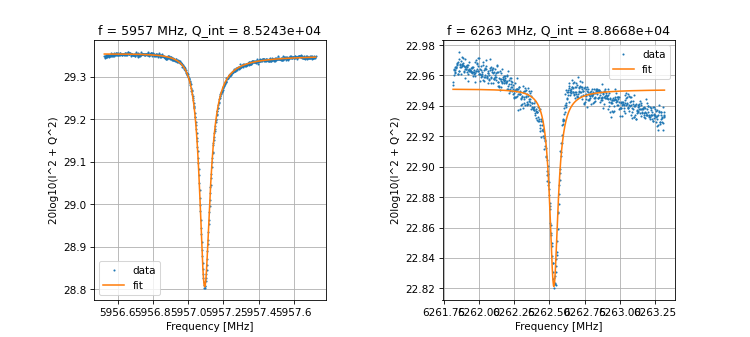

Frequencies out are: [5957.091662469293, 6262.531239655212] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.320 s


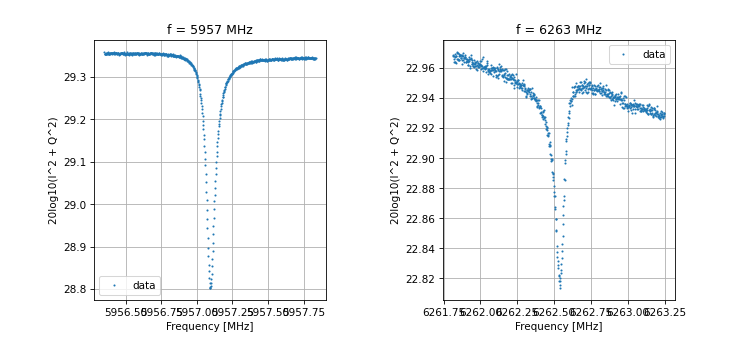

Saving data-2024-03-10-04-21-58
Frequencies out are: [6536.59, 6829.28] MHz


  0%|          | 0/1 [00:00<?, ?it/s]

Final time = 15.442 s


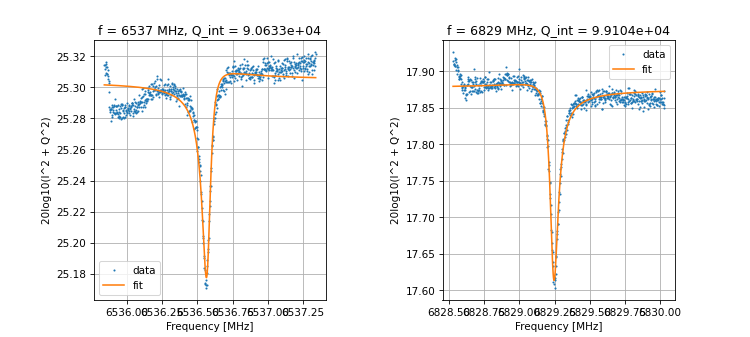

Frequencies out are: [6536.571578029591, 6829.2417352416405] MHz


  0%|          | 0/3 [00:00<?, ?it/s]

Final time = 46.331 s


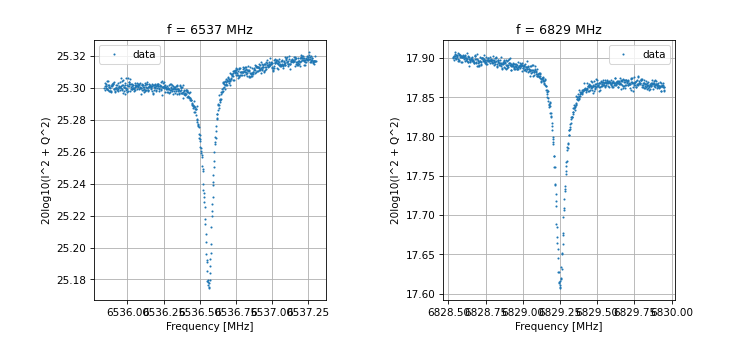

100%|██████████| 19/19 [14:18:31<00:00, 2711.11s/it]

Saving data-2024-03-10-04-23-02
Time for measurement:
14:18:31.175901


In [17]:
# remember to check that lakeshore is on PID mode and current heater range is correct
# set temperatures
### Turbo On - 18 mK to 50 mK
temps = np.arange(.210,.500,.02)
print(temps)

time.sleep(2*60*60)

# Main for loop:
start_time = time.time()
dBm_lookups = ['10_atten-channel-1_rack-setup_2024-03-08.npz','11_atten-channel-2_rack-setup_2024-03-08.npz']
run_FFS(temps, socs, chipDicts, soccfgs, dBm_lookups=dBm_lookups, turbo=False)#Turbo true for low T measurement
end_time = time.time()
print('Time for measurement:')
print(datetime.timedelta(seconds=end_time-start_time))


In [12]:
tc.setTemp(0)